Author Lingting Shi, from Elham Azizi lab
Functions of this notebook is written by Zicheng Wang from Yufeng Shen lab from https://github.com/princello/TCRB_matching

In [1]:
import numpy as np
import pandas as pd
import anndata
import scanpy as sc
import seaborn as sns
import os
import matplotlib.pyplot as plt
from pathlib import Path

In [2]:
PROJECT_ROOT = Path('../..')

# Input paths
TCR_SEL_ALL_PATH              = PROJECT_ROOT / 'adata_file' / 'tcr_sel_all.csv'
TCELL_ANN_CONCAT_REFINED_PATH = PROJECT_ROOT / 'adata_file' / 'tcell_ann.h5ad'
ALLCLONES_ALL_UNIQUE_PATH     = PROJECT_ROOT / 'adata_file' / 'AllClones_ExtraW0.csv'

# Output paths
TCR_SEL_ALL_MAPPED_PATH       = PROJECT_ROOT / 'adata_file' / 'tcr_sel_all_mapped.csv'
TCELL_ANN_MAPPED_PATH         = PROJECT_ROOT / 'adata_file' / 'tcell_ann_mapped.h5ad'
FIGURES_DIR                   = PROJECT_ROOT / 'Figures' / 'Single_cell_figures'
FIGURES_DIR.mkdir(parents=True, exist_ok=True)

shared_patients = ['C068', 'C101', 'C98', 'C66', 'C86', 'C160', 'C179', 'C155']

# Load in mapped data

In [3]:
tcr_sel_all = pd.read_csv(TCR_SEL_ALL_PATH)

# Load in scRNA seq

In [4]:
#load in single cell data
tcell_ann = anndata.read_h5ad(TCELL_ANN_CONCAT_REFINED_PATH)

In [5]:
tcell_ann.obs.index.unique()

Index(['R096_Tc17_up_AAACCTGCATCCCACT-1', 'R096_Tc17_up_AAACCTGGTTGGAGGT-1',
       'R096_Tc17_up_AAACCTGTCTATCCTA-1', 'R096_Tc17_up_AAACGGGAGGATGCGT-1',
       'R096_Tc17_up_AAACGGGGTAAATGAC-1', 'R096_Tc17_up_AAAGATGCAAACTGTC-1',
       'R096_Tc17_up_AAAGATGGTAGCGTGA-1', 'R096_Tc17_up_AAAGATGGTCGTTGTA-1',
       'R096_Tc17_up_AAAGATGTCTATGTGG-1', 'R096_Tc17_up_AAAGCAAAGCTTATCG-1',
       ...
       'UA41_TGAGCATGTTAAGATG-1', 'UA41_TGCGCAGTCCAAGTAC-1',
       'UA41_TGCTACCAGGGCTCTC-1', 'UA41_TGCTGCTTCTTGTCAT-1',
       'UA41_TGGCCAGTCGCCAAAT-1', 'UA41_TGTTCCGAGGACAGCT-1',
       'UA41_TTAGGACGTTGTTTGG-1', 'UA41_TTAGGACTCCCAAGAT-1',
       'UA41_TTCGAAGTCCGCATCT-1', 'UA41_TTGCGTCCAAGAAAGG-1'],
      dtype='object', length=50416)

In [6]:
tcell_ann

AnnData object with n_obs × n_vars = 50416 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'B_doublet_colors', 'Epithelial_doublet_colors', 'Fibroblast_doublet_colors', 'Macrophage_doublet_colors'

In [7]:
tcell_ann_shared = tcell_ann[tcell_ann.obs['PatientID'].isin(shared_patients)]

In [8]:
tcell_ann_shared

View of AnnData object with n_obs × n_vars = 28904 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'B_doublet_colors', 'Epithelial_doublet_colors', 'Fibroblast_doublet_colors', 'Macrophage_doublet

In [9]:
tcell_ann.obs['SampleID']

R096_Tc17_up_AAACCTGCATCCCACT-1    R096_Tc17_up
R096_Tc17_up_AAACCTGGTTGGAGGT-1    R096_Tc17_up
R096_Tc17_up_AAACCTGTCTATCCTA-1    R096_Tc17_up
R096_Tc17_up_AAACGGGAGGATGCGT-1    R096_Tc17_up
R096_Tc17_up_AAACGGGGTAAATGAC-1    R096_Tc17_up
                                       ...     
UA41_TGTTCCGAGGACAGCT-1                    UA41
UA41_TTAGGACGTTGTTTGG-1                    UA41
UA41_TTAGGACTCCCAAGAT-1                    UA41
UA41_TTCGAAGTCCGCATCT-1                    UA41
UA41_TTGCGTCCAAGAAAGG-1                    UA41
Name: SampleID, Length: 50416, dtype: category
Categories (50, object): ['R096_Tc17_low', 'R096_Tc17_up', 'RH01', 'RH02', ..., 'UA38', 'UA39', 'UA40', 'UA41']

In [10]:
tcell_ann.obs['SampleID_barcode'] = tcell_ann.obs.index.str.replace(r'_(?=[ACGT]+-\d+$)', '', regex=True)

In [11]:
tcell_ann.obs

,PatientID,SampleID,FreshorFrozen,Days_post-Transplant,Tissue_Location,LPorIE,Enrichment Method,Pathological_grade_of_GVHD,Grade_num,GVHD_Grade_1,...,leiden_0.15,B_doublet,Myeloid_doublet,Macrophage_doublet,Monocyte_doublet,Epithelial_doublet,Fibroblast_doublet,plasma_doublet2,if_doublet,SampleID_barcode
R096_Tc17_up_AAACCTGCATCCCACT-1,R096,R096_Tc17_up,Fresh,27.0,Upper GI,Lamina Propria Cells,TCRab Enriched,Mild,2,Mild,...,0,False,False,False,True,False,True,False,True,R096_Tc17_upAAACCTGCATCCCACT-1
R096_Tc17_up_AAACCTGGTTGGAGGT-1,R096,R096_Tc17_up,Fresh,27.0,Upper GI,Lamina Propria Cells,TCRab Enriched,Mild,2,Mild,...,0,False,False,False,False,False,False,False,False,R096_Tc17_upAAACCTGGTTGGAGGT-1
R096_Tc17_up_AAACCTGTCTATCCTA-1,R096,R096_Tc17_up,Fresh,27.0,Upper GI,Lamina Propria Cells,TCRab Enriched,Mild,2,Mild,...,0,False,False,False,False,False,False,False,False,R096_Tc17_upAAACCTGTCTATCCTA-1
R096_Tc17_up_AAACGGGAGGATGCGT-1,R096,R096_Tc17_up,Fresh,27.0,Upper GI,Lamina Propria Cells,TCRab Enriched,Mild,2,Mild,...,0,False,False,False,False,False,False,False,False,R096_Tc17_upAAACGGGAGGATGCGT-1
R096_Tc17_up_AAACGGGGTAAATGAC-1,R096,R096_Tc17_up,Fresh,27.0,Upper GI,Lamina Propria Cells,TCRab Enriched,Mild,2,Mild,...,0,False,False,False,False,False,False,False,False,R096_Tc17_upAAACGGGGTAAATGAC-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
UA41_TGTTCCGAGGACAGCT-1,ND003,UA41,Fresh,NaN,Upper GI,Lamina Propria Cells,MACS CD45+ Enriched,ND,ND,ND,...,0,False,False,False,False,False,False,False,False,UA41TGTTCCGAGGACAGCT-1
UA41_TTAGGACGTTGTTTGG-1,ND003,UA41,Fresh,NaN,Upper GI,Lamina Propria Cells,MACS CD45+ Enriched,ND,ND,ND,...,5,False,False,False,False,False,False,False,False,UA41TTAGGACGTTGTTTGG-1
UA41_TTAGGACTCCCAAGAT-1,ND003,UA41,Fresh,NaN,Upper GI,Lamina Propria Cells,MACS CD45+ Enriched,ND,ND,ND,...,0,False,False,False,False,False,False,False,False,UA41TTAGGACTCCCAAGAT-1
UA41_TTCGAAGTCCGCATCT-1,ND003,UA41,Fresh,NaN,Upper GI,Lamina Propria Cells,MACS CD45+ Enriched,ND,ND,ND,...,0,False,False,False,False,False,False,False,False,UA41TTCGAAGTCCGCATCT-1


In [12]:
tcell_ann.obs.index.unique()

Index(['R096_Tc17_up_AAACCTGCATCCCACT-1', 'R096_Tc17_up_AAACCTGGTTGGAGGT-1',
       'R096_Tc17_up_AAACCTGTCTATCCTA-1', 'R096_Tc17_up_AAACGGGAGGATGCGT-1',
       'R096_Tc17_up_AAACGGGGTAAATGAC-1', 'R096_Tc17_up_AAAGATGCAAACTGTC-1',
       'R096_Tc17_up_AAAGATGGTAGCGTGA-1', 'R096_Tc17_up_AAAGATGGTCGTTGTA-1',
       'R096_Tc17_up_AAAGATGTCTATGTGG-1', 'R096_Tc17_up_AAAGCAAAGCTTATCG-1',
       ...
       'UA41_TGAGCATGTTAAGATG-1', 'UA41_TGCGCAGTCCAAGTAC-1',
       'UA41_TGCTACCAGGGCTCTC-1', 'UA41_TGCTGCTTCTTGTCAT-1',
       'UA41_TGGCCAGTCGCCAAAT-1', 'UA41_TGTTCCGAGGACAGCT-1',
       'UA41_TTAGGACGTTGTTTGG-1', 'UA41_TTAGGACTCCCAAGAT-1',
       'UA41_TTCGAAGTCCGCATCT-1', 'UA41_TTGCGTCCAAGAAAGG-1'],
      dtype='object', length=50416)

In [13]:
tcr_sel_all

,barcode,SampleID_barcode,raw_clonotype_id,cdr3,cdr3_nt,#clones,V1,V2,J1,J2,Adaptive NT sequences,patient
0,AAACCTGTCAAGGTAA-1,UA01AAACCTGTCAAGGTAA-1,clonotype73,CSARDRGGQSYYEQYF,TGCAGTGCTAGAGATCGGGGGGGACAAAGCTACTACGAGCAGTACTTC,7,20,1,2,7,AGTGCCCATCCTGAAGACAGCAGCTTCTACATCTGCAGTGCTAGAG...,C068
1,AAACGGGAGCCAGAAC-1,UA01AAACGGGAGCCAGAAC-1,clonotype10,CSASLVGSLEGAFF,TGCAGTGCTAGTTTGGTGGGGTCCCTTGAGGGAGCTTTCTTT,42,20,1,1,1,GTGACCAGTGCCCATCCTGAAGACAGCAGCTTCTACATCTGCAGTG...,C068
2,AAACGGGTCGTCGTTC-1,UA01AAACGGGTCGTCGTTC-1,clonotype4,CSARVLAGVSYNEQFF,TGCAGTGCTAGAGTGCTAGCGGGAGTTTCCTACAATGAGCAGTTCTTC,88,20,1,2,1,AGTGCCCATCCTGAAGACAGCAGCTTCTACATCTGCAGTGCTAGAG...,C068
3,AAACGGGTCGTCGTTC-1,UA01AAACGGGTCGTCGTTC-1,clonotype4,CSARRLAGISYNEQFF,TGCAGTGCTAGGCGACTAGCGGGGATCTCCTACAATGAGCAGTTCTTC,88,20,1,2,1,AGTGCCCATCCTGAAGACAGCAGCTTCTACATCTGCAGTGCTAGGC...,C068
4,AAAGATGAGCGTAGTG-1,UA01AAAGATGAGCGTAGTG-1,clonotype327,CASSLSAGGFGGYTF,TGTGCCAGCAGCTTGTCGGCAGGGGGCTTTGGTGGCTACACCTTC,3,5,6,1,2,AACGCCTTGTTGCTGGGGGACTCGGCCCTCTATCTCTGTGCCAGCA...,C068
...,...,...,...,...,...,...,...,...,...,...,...,...
22215,TTGTAGGTCAGGATCT-1,UA37TTGTAGGTCAGGATCT-1,clonotype611,CASSRGGSSYNEQFF,TGTGCCAGCAGCCGCGGGGGGAGCTCCTACAATGAGCAGTTCTTC,1,11,2,2,1,CAGCCTGCAAAGCTTGAGGACTCGGCCGTGTATCTCTGTGCCAGCA...,C179
22216,TTTACTGCAGAGCCAA-1,UA37TTTACTGCAGAGCCAA-1,clonotype17,CASCPDSYGYTF,TGTGCCAGCTGCCCCGATTCCTATGGCTACACCTTC,9,6,2,1,2,NNNNNNNNNNTGTCGGCTGCTCCCTCCCAAACATCTGTGTACTTCT...,C179
22217,TTTACTGTCCCAAGAT-1,UA37TTTACTGTCCCAAGAT-1,clonotype72,CASSRQPAGTDFYEQYF,TGCGCCAGCAGCCGCCAACCTGCCGGGACAGACTTTTACGAGCAGT...,5,4,1,2,7,CTGCAGCCAGAAGACTCAGCCCTGTATCTCTGCGCCAGCAGCCGCC...,C179
22218,TTTCCTCAGACACGAC-1,UA37TTTCCTCAGACACGAC-1,clonotype585,CASSLTSGVYNEQFF,TGTGCCAGCAGCCTTACTAGCGGGGTTTACAATGAGCAGTTCTTC,1,11,1,2,1,CAGCCTGCAGAGCTTGGGGACTCGGCCATGTATCTCTGTGCCAGCA...,C179


C068


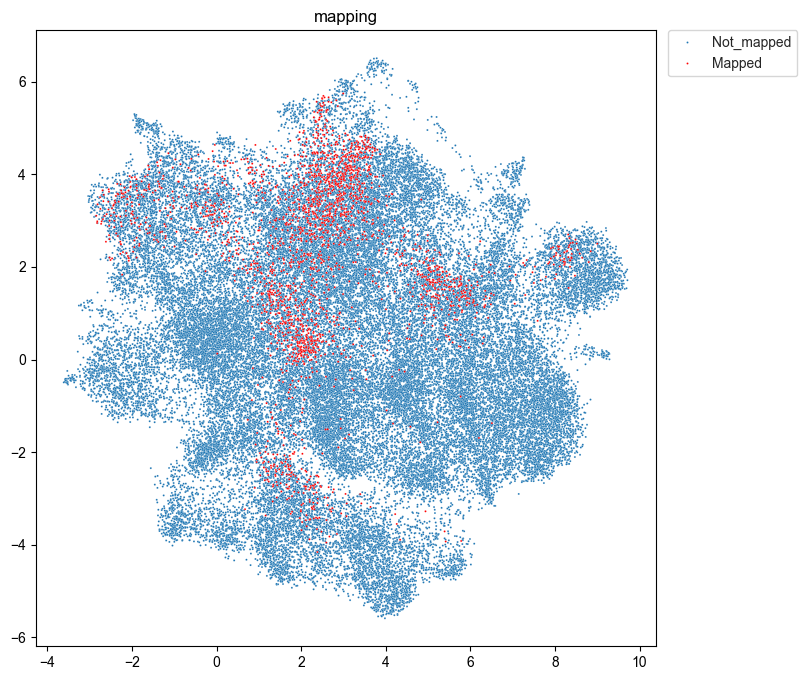

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/567777526.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


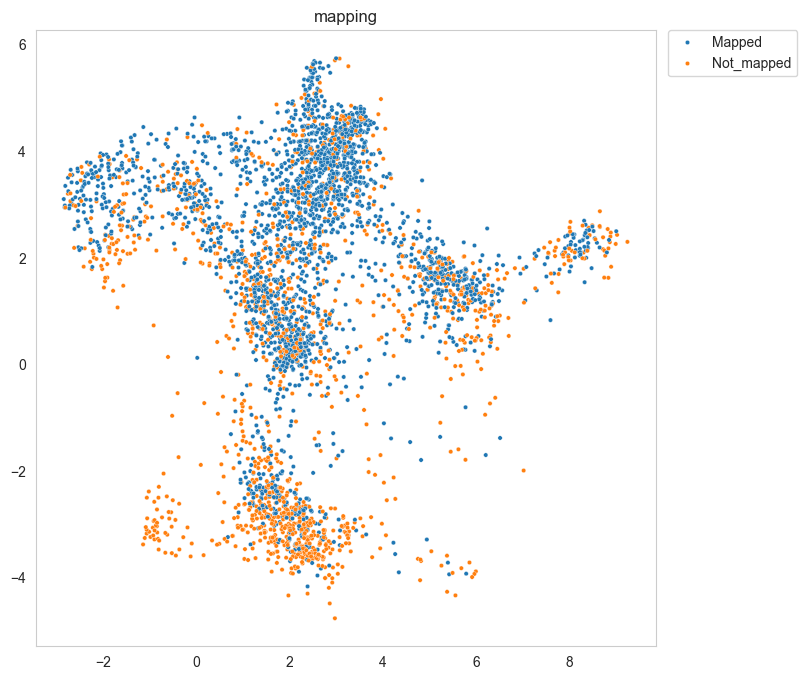

C101


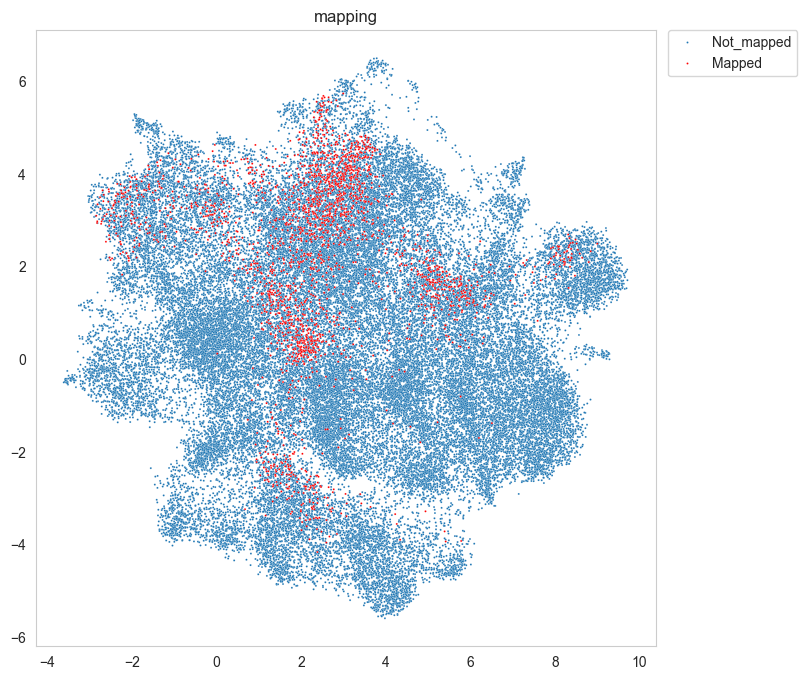

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/567777526.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


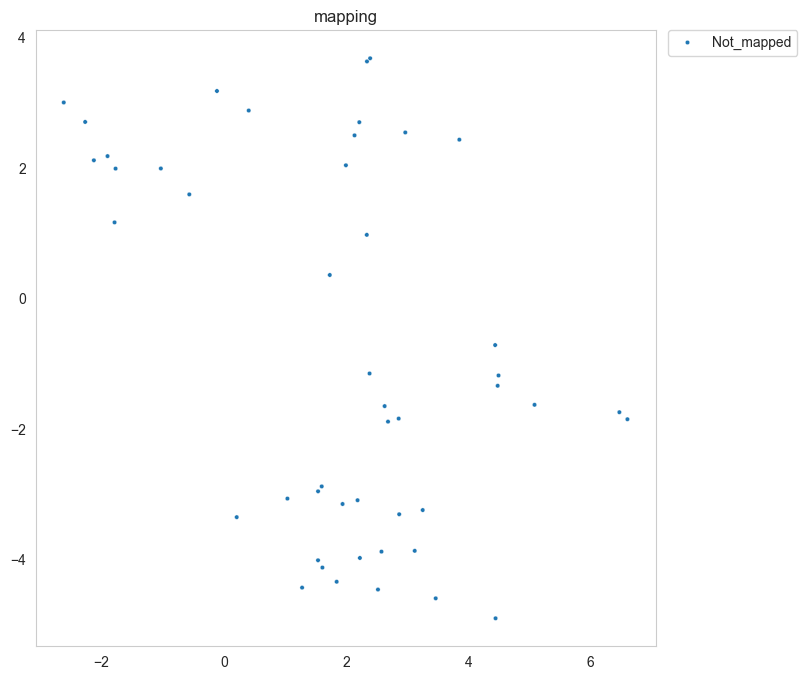

C98


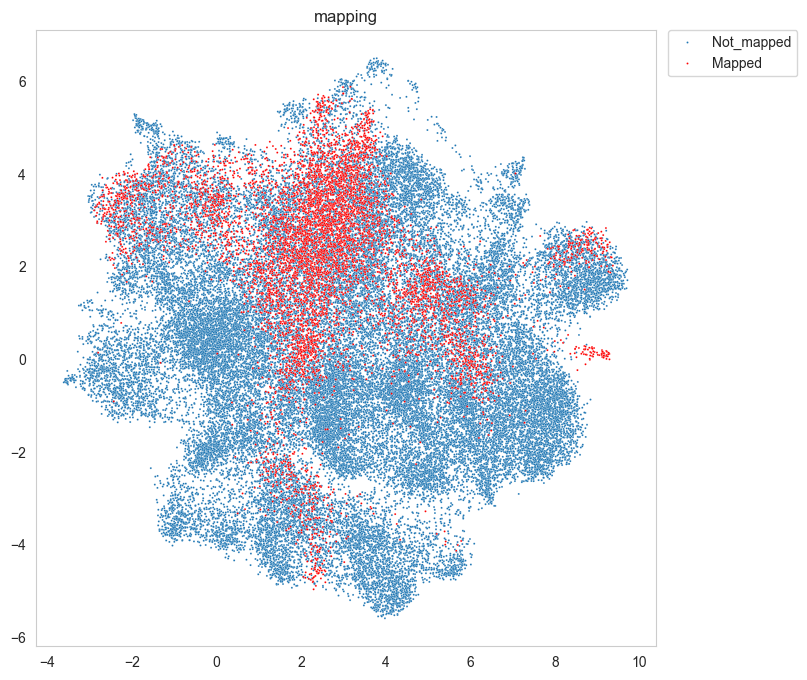

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/567777526.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


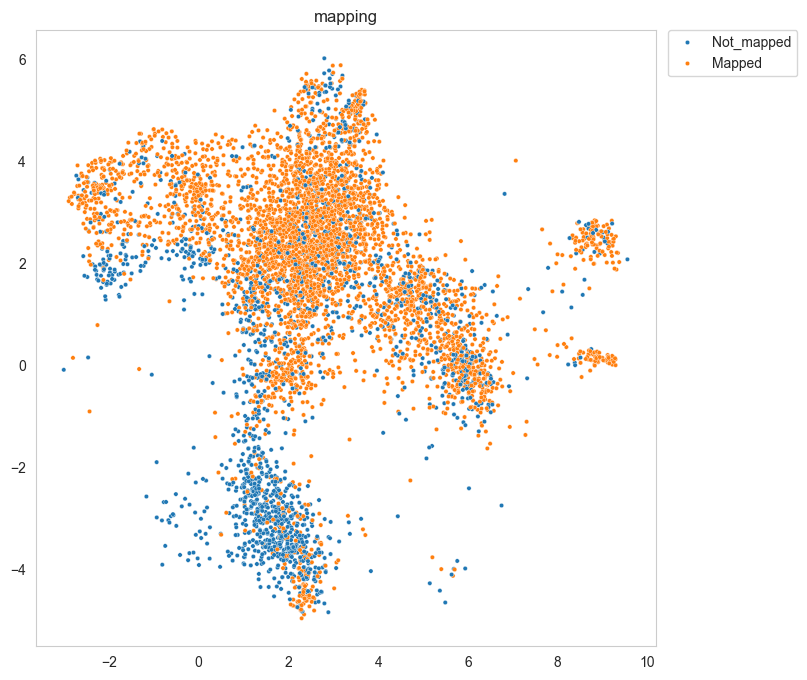

C66


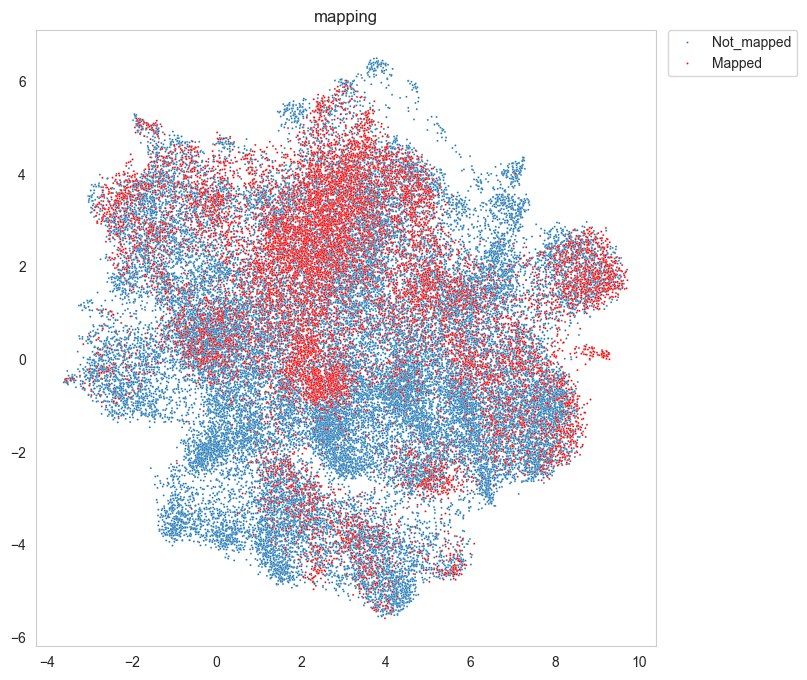

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/567777526.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


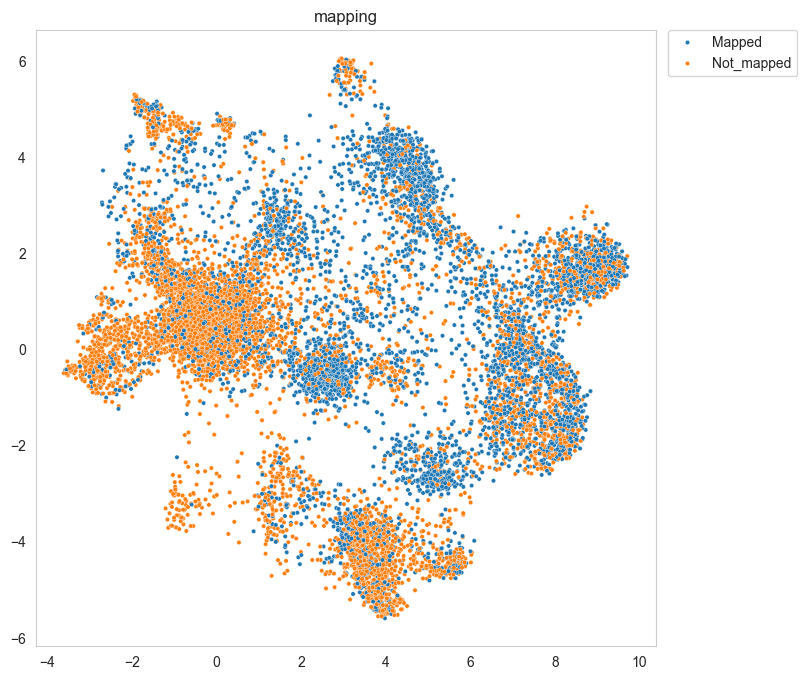

C86


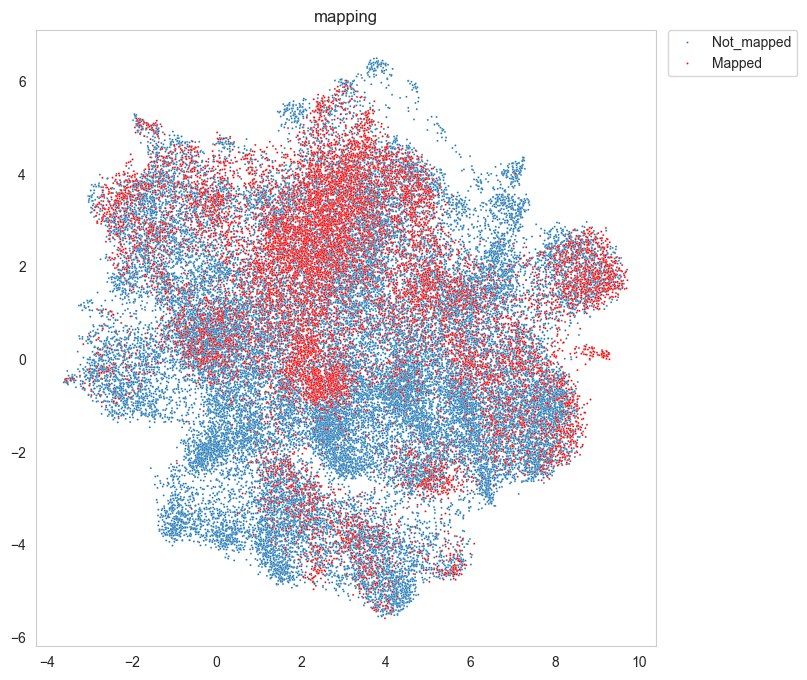

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/567777526.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


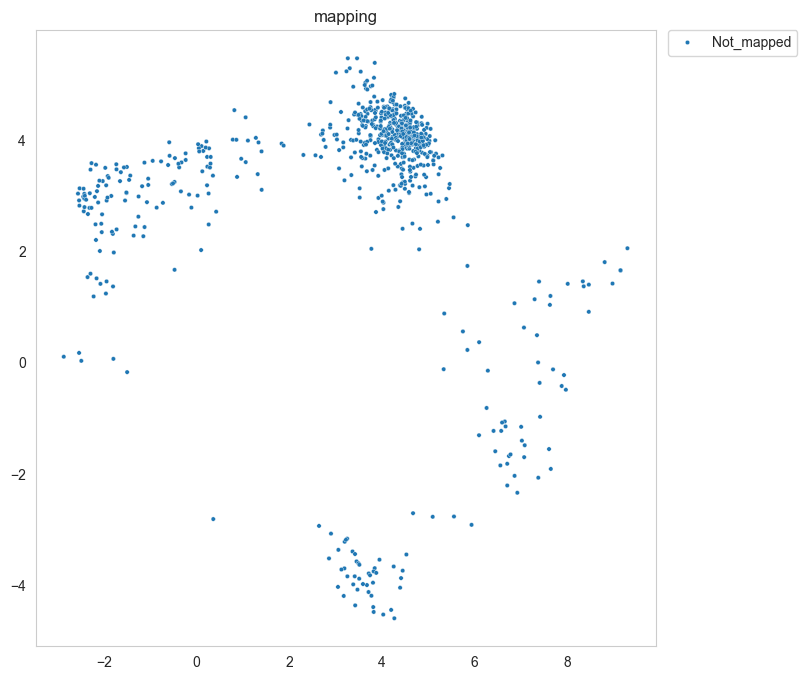

C160


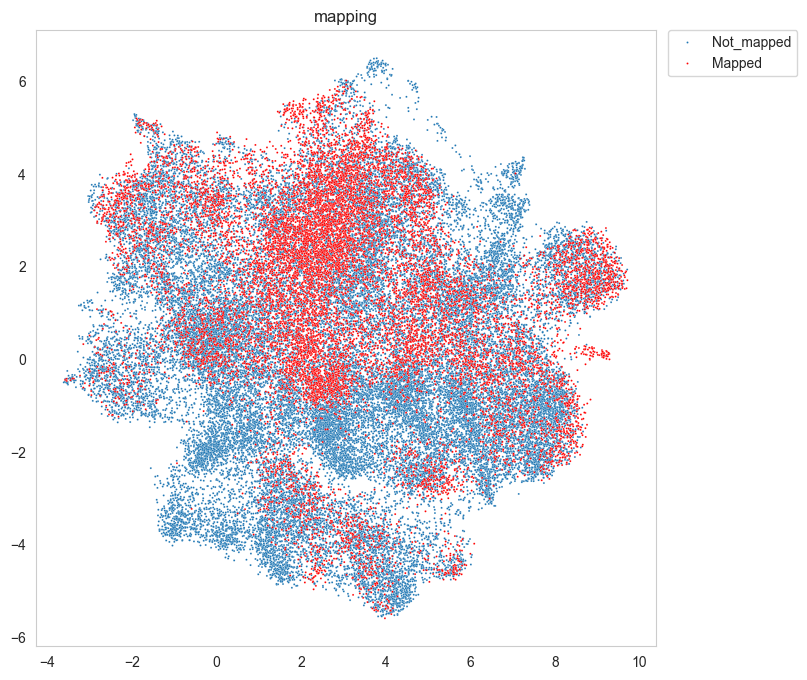

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/567777526.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


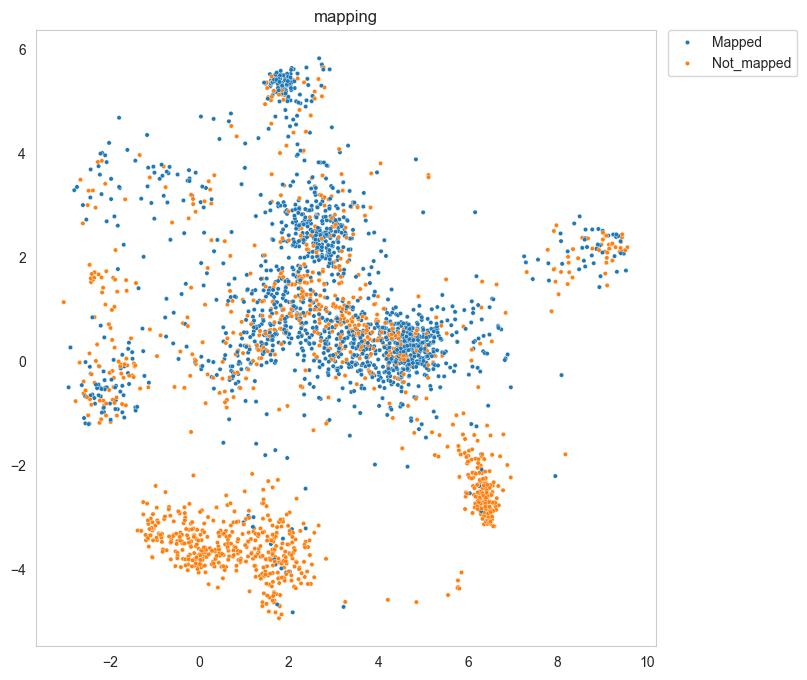

C179


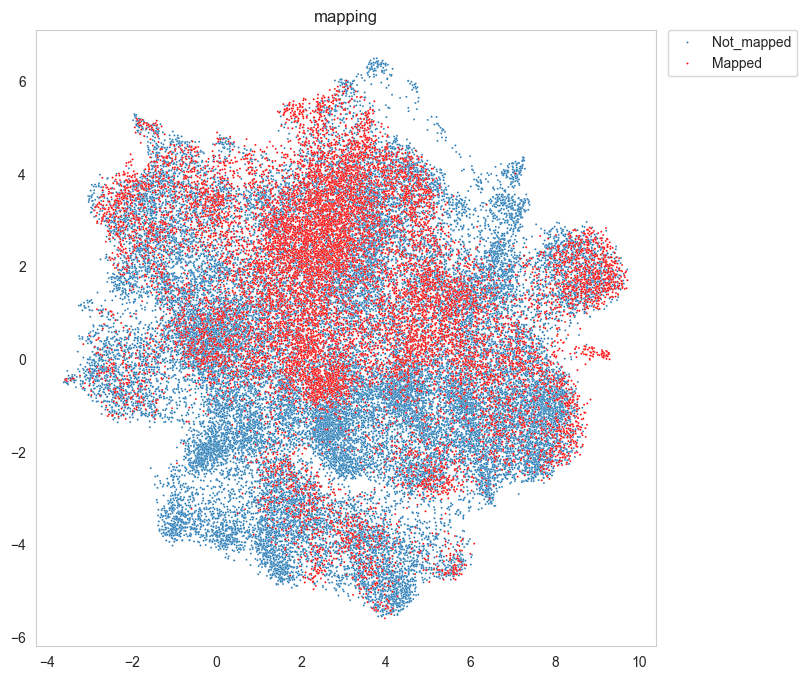

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/567777526.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


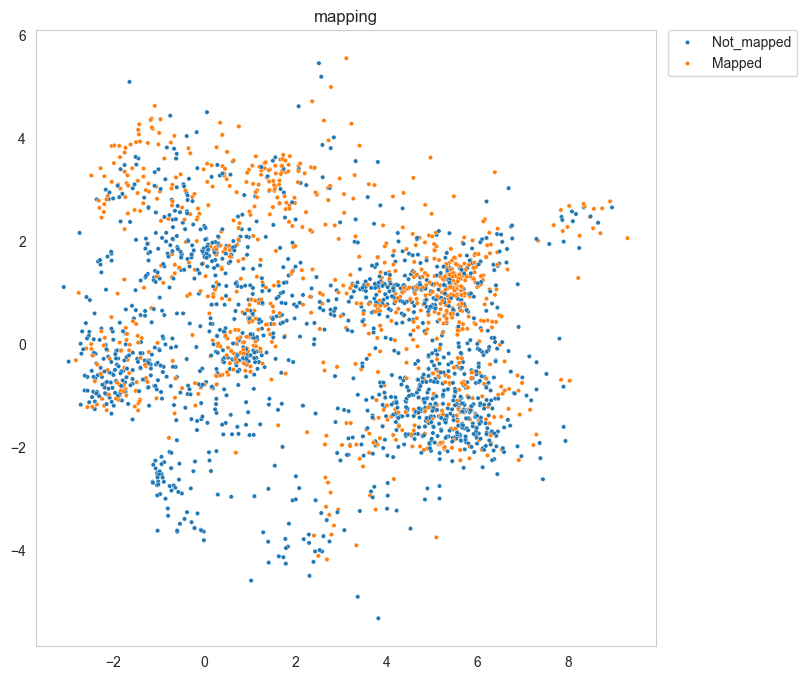

C155


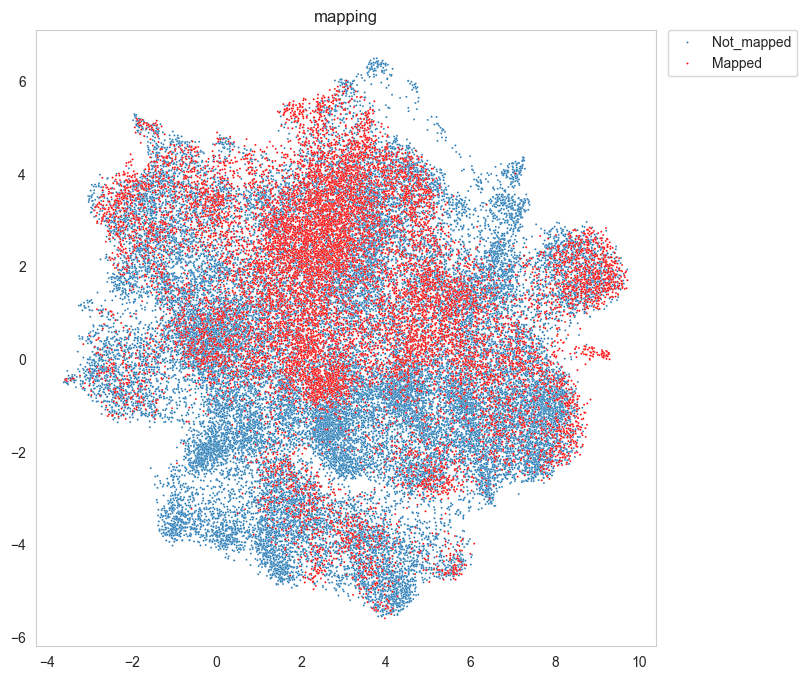

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/567777526.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


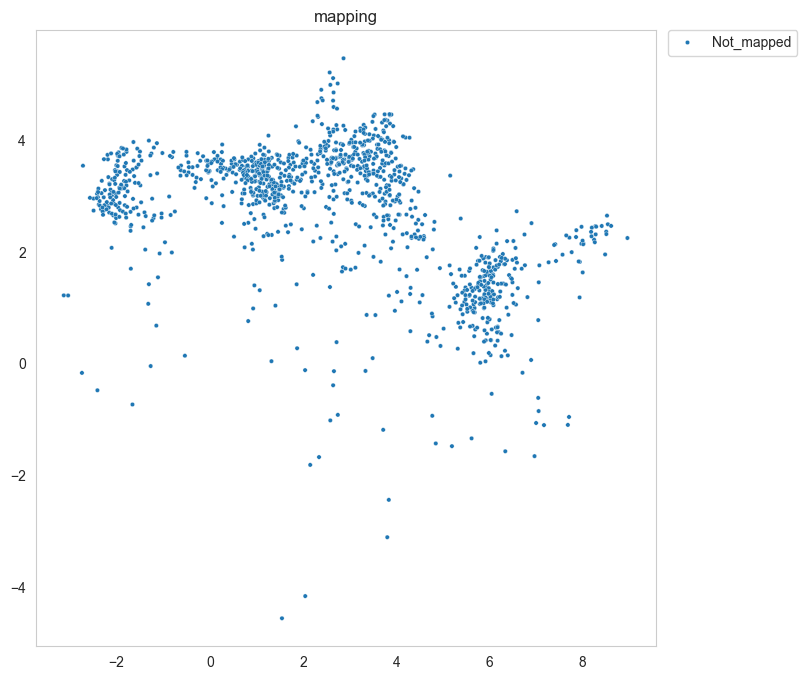

In [14]:
# How many cells are mapped
tcell_ann.obs['mapping'] ="Not_mapped"
for patient in shared_patients:
    print(patient)
    tcr_sel = tcr_sel_all[tcr_sel_all['patient']==patient]
    tcell_patient= tcell_ann[tcell_ann.obs['PatientID']==patient]
    if len(tcr_sel) > 0:
        # Create a list of patterns from the 'barcode' column
        barcode_patterns = tcr_sel['SampleID_barcode'].tolist()
        # Join patterns with "|" for regex OR operation
        combined_pattern = '|'.join(barcode_patterns)
        # Check if any pattern is present in the index of tcell_patient.obs
        matches = tcell_patient.obs['SampleID_barcode'].str.contains(combined_pattern)

        #tcell_patient.obs['mapping'] ="Not_mapped"
        tcell_patient.obs.loc[matches,"mapping"]= 'Mapped'
        
        tcell_patient_mapped = tcell_patient[tcell_patient.obs['mapping']=='Mapped']
        tcell_ann.obs.loc[tcell_ann.obs.index.isin(tcell_patient_mapped.obs.index),"mapping"]= 'Mapped'
        
        
    meta = 'mapping'
    fig, ax = plt.subplots(figsize=(8,8))
    sns.set_style("whitegrid", {'axes.grid' : False})
    sns.scatterplot(x=tcell_ann[tcell_ann.obs['mapping'] =='Not_mapped'].obsm["X_umap"][:,0],y=tcell_ann[tcell_ann.obs['mapping'] =='Not_mapped'].obsm["X_umap"][:,1], hue=tcell_ann[tcell_ann.obs['mapping'] =='Not_mapped'].obs[meta],s=2)
    sns.scatterplot(x=tcell_ann[tcell_ann.obs['mapping'] =='Mapped'].obsm["X_umap"][:,0],y=tcell_ann[tcell_ann.obs['mapping'] =='Mapped'].obsm["X_umap"][:,1], hue=tcell_ann[tcell_ann.obs['mapping'] =='Mapped', ].obs[meta],s=2,palette=['red']).set(title=meta)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    plt.show()
    
    
    randomize=np.arange(len(tcell_patient.obs[meta]))
    np.random.shuffle(randomize)
    fig, ax = plt.subplots(figsize=(8,8))
    sns.set_style("whitegrid", {'axes.grid' : False})
    scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    plt.show()

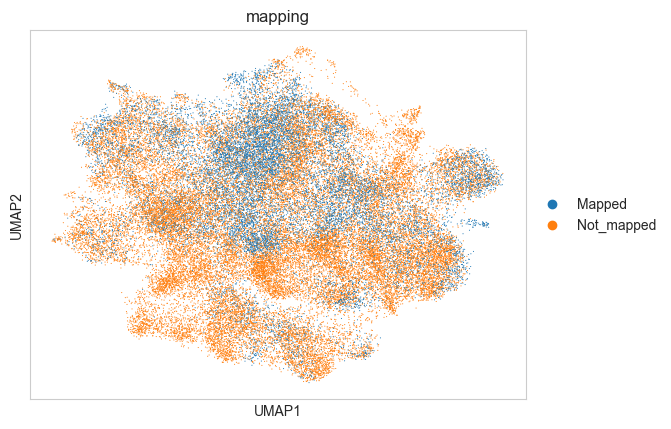

In [15]:
sc.pl.umap(tcell_ann, color=['mapping'])

In [16]:
tcr_sel_all_mapped = tcr_sel_all[tcr_sel_all['SampleID_barcode'].isin(tcell_ann[tcell_ann.obs['mapping']=="Mapped"].obs["SampleID_barcode"])]

In [17]:
tcr_sel_all_mapped

,barcode,SampleID_barcode,raw_clonotype_id,cdr3,cdr3_nt,#clones,V1,V2,J1,J2,Adaptive NT sequences,patient
0,AAACCTGTCAAGGTAA-1,UA01AAACCTGTCAAGGTAA-1,clonotype73,CSARDRGGQSYYEQYF,TGCAGTGCTAGAGATCGGGGGGGACAAAGCTACTACGAGCAGTACTTC,7,20,1,2,7,AGTGCCCATCCTGAAGACAGCAGCTTCTACATCTGCAGTGCTAGAG...,C068
1,AAACGGGAGCCAGAAC-1,UA01AAACGGGAGCCAGAAC-1,clonotype10,CSASLVGSLEGAFF,TGCAGTGCTAGTTTGGTGGGGTCCCTTGAGGGAGCTTTCTTT,42,20,1,1,1,GTGACCAGTGCCCATCCTGAAGACAGCAGCTTCTACATCTGCAGTG...,C068
2,AAACGGGTCGTCGTTC-1,UA01AAACGGGTCGTCGTTC-1,clonotype4,CSARVLAGVSYNEQFF,TGCAGTGCTAGAGTGCTAGCGGGAGTTTCCTACAATGAGCAGTTCTTC,88,20,1,2,1,AGTGCCCATCCTGAAGACAGCAGCTTCTACATCTGCAGTGCTAGAG...,C068
3,AAACGGGTCGTCGTTC-1,UA01AAACGGGTCGTCGTTC-1,clonotype4,CSARRLAGISYNEQFF,TGCAGTGCTAGGCGACTAGCGGGGATCTCCTACAATGAGCAGTTCTTC,88,20,1,2,1,AGTGCCCATCCTGAAGACAGCAGCTTCTACATCTGCAGTGCTAGGC...,C068
4,AAAGATGAGCGTAGTG-1,UA01AAAGATGAGCGTAGTG-1,clonotype327,CASSLSAGGFGGYTF,TGTGCCAGCAGCTTGTCGGCAGGGGGCTTTGGTGGCTACACCTTC,3,5,6,1,2,AACGCCTTGTTGCTGGGGGACTCGGCCCTCTATCTCTGTGCCAGCA...,C068
...,...,...,...,...,...,...,...,...,...,...,...,...
22209,TTCTTAGTCCTGCAGG-1,UA37TTCTTAGTCCTGCAGG-1,clonotype515,CASMKGGTGNYGYTF,TGTGCCAGCATGAAAGGCGGAACAGGGAACTATGGCTACACCTTC,2,6,5,1,2,NTGTCGGCTGCTCCCTCCCAGACATCTGTGTACTTCTGTGCCAGCA...,C179
22212,TTGCGTCTCGCGTTTC-1,UA37TTGCGTCTCGCGTTTC-1,clonotype586,CASSLSGGANYGYTF,TGTGCCAGCAGCTTAAGCGGAGGAGCTAACTATGGCTACACCTTC,1,7,3,1,2,CAGCGCACAGAGCGGGGGGACTCAGCCGTGTATCTCTGTGCCAGCA...,C179
22215,TTGTAGGTCAGGATCT-1,UA37TTGTAGGTCAGGATCT-1,clonotype611,CASSRGGSSYNEQFF,TGTGCCAGCAGCCGCGGGGGGAGCTCCTACAATGAGCAGTTCTTC,1,11,2,2,1,CAGCCTGCAAAGCTTGAGGACTCGGCCGTGTATCTCTGTGCCAGCA...,C179
22216,TTTACTGCAGAGCCAA-1,UA37TTTACTGCAGAGCCAA-1,clonotype17,CASCPDSYGYTF,TGTGCCAGCTGCCCCGATTCCTATGGCTACACCTTC,9,6,2,1,2,NNNNNNNNNNTGTCGGCTGCTCCCTCCCAAACATCTGTGTACTTCT...,C179


In [18]:
tcr_sel_all_mapped = pd.merge(tcr_sel_all_mapped,tcell_ann.obs,on='SampleID_barcode', how='left')

In [19]:
tcr_sel_all_mapped

,barcode,SampleID_barcode,raw_clonotype_id,cdr3,cdr3_nt,#clones,V1,V2,J1,J2,...,leiden_0.15,B_doublet,Myeloid_doublet,Macrophage_doublet,Monocyte_doublet,Epithelial_doublet,Fibroblast_doublet,plasma_doublet2,if_doublet,mapping
0,AAACCTGTCAAGGTAA-1,UA01AAACCTGTCAAGGTAA-1,clonotype73,CSARDRGGQSYYEQYF,TGCAGTGCTAGAGATCGGGGGGGACAAAGCTACTACGAGCAGTACTTC,7,20,1,2,7,...,5,False,False,False,False,False,False,False,False,Mapped
1,AAACGGGAGCCAGAAC-1,UA01AAACGGGAGCCAGAAC-1,clonotype10,CSASLVGSLEGAFF,TGCAGTGCTAGTTTGGTGGGGTCCCTTGAGGGAGCTTTCTTT,42,20,1,1,1,...,0,False,False,False,False,False,False,False,False,Mapped
2,AAACGGGTCGTCGTTC-1,UA01AAACGGGTCGTCGTTC-1,clonotype4,CSARVLAGVSYNEQFF,TGCAGTGCTAGAGTGCTAGCGGGAGTTTCCTACAATGAGCAGTTCTTC,88,20,1,2,1,...,0,False,False,False,False,False,False,False,False,Mapped
3,AAACGGGTCGTCGTTC-1,UA01AAACGGGTCGTCGTTC-1,clonotype4,CSARRLAGISYNEQFF,TGCAGTGCTAGGCGACTAGCGGGGATCTCCTACAATGAGCAGTTCTTC,88,20,1,2,1,...,0,False,False,False,False,False,False,False,False,Mapped
4,AAAGATGAGCGTAGTG-1,UA01AAAGATGAGCGTAGTG-1,clonotype327,CASSLSAGGFGGYTF,TGTGCCAGCAGCTTGTCGGCAGGGGGCTTTGGTGGCTACACCTTC,3,5,6,1,2,...,5,False,False,False,False,False,False,False,False,Mapped
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14853,TTCTTAGTCCTGCAGG-1,UA37TTCTTAGTCCTGCAGG-1,clonotype515,CASMKGGTGNYGYTF,TGTGCCAGCATGAAAGGCGGAACAGGGAACTATGGCTACACCTTC,2,6,5,1,2,...,0,False,True,True,True,False,False,False,True,Mapped
14854,TTGCGTCTCGCGTTTC-1,UA37TTGCGTCTCGCGTTTC-1,clonotype586,CASSLSGGANYGYTF,TGTGCCAGCAGCTTAAGCGGAGGAGCTAACTATGGCTACACCTTC,1,7,3,1,2,...,0,False,False,False,True,False,False,False,True,Mapped
14855,TTGTAGGTCAGGATCT-1,UA37TTGTAGGTCAGGATCT-1,clonotype611,CASSRGGSSYNEQFF,TGTGCCAGCAGCCGCGGGGGGAGCTCCTACAATGAGCAGTTCTTC,1,11,2,2,1,...,0,False,False,False,True,False,False,False,True,Mapped
14856,TTTACTGCAGAGCCAA-1,UA37TTTACTGCAGAGCCAA-1,clonotype17,CASCPDSYGYTF,TGTGCCAGCTGCCCCGATTCCTATGGCTACACCTTC,9,6,2,1,2,...,0,False,False,False,False,False,False,False,False,Mapped


In [20]:
tcr_sel_all_mapped.to_csv(TCR_SEL_ALL_MAPPED_PATH, index=False)

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/3830868714.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcell_ann_shared.obs['mapping'] ="Not_mapped"


C068


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/3830868714.py:16: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcell_patient.obs['mapping'] ="Not_mapped"


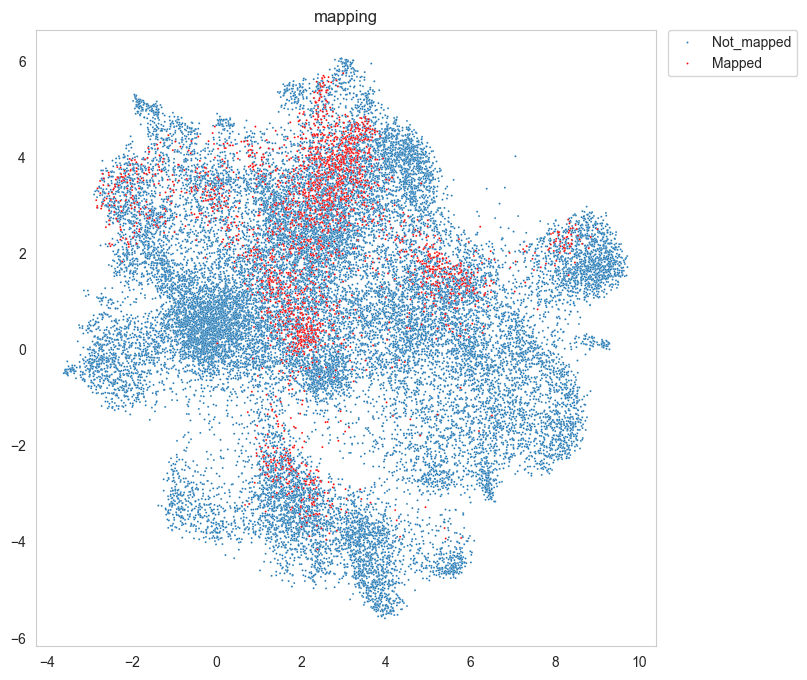

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/3830868714.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


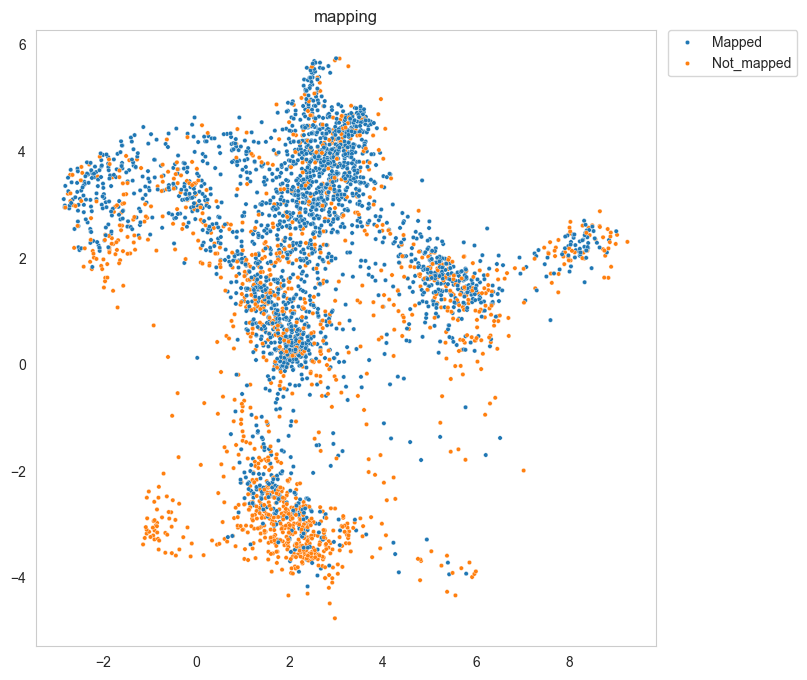

C101


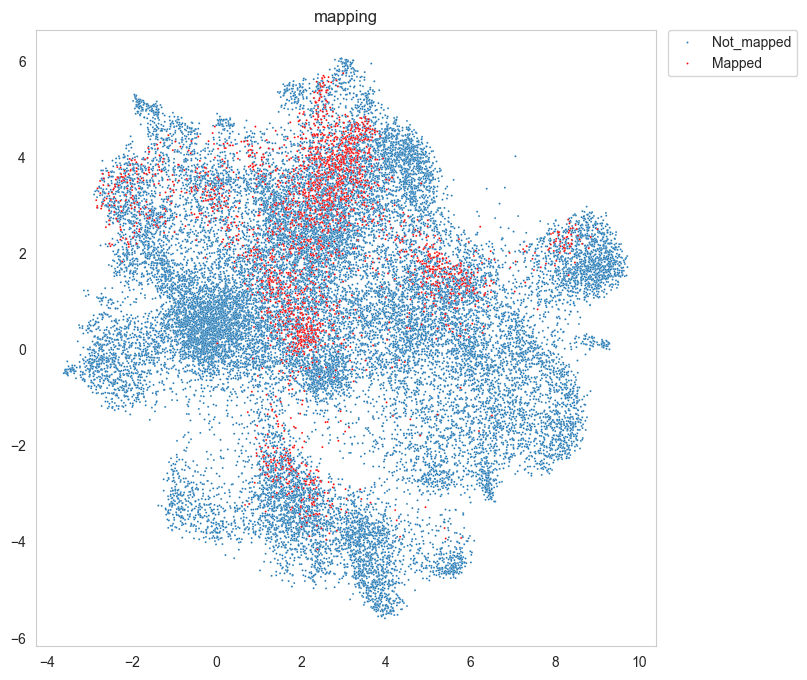

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/3830868714.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


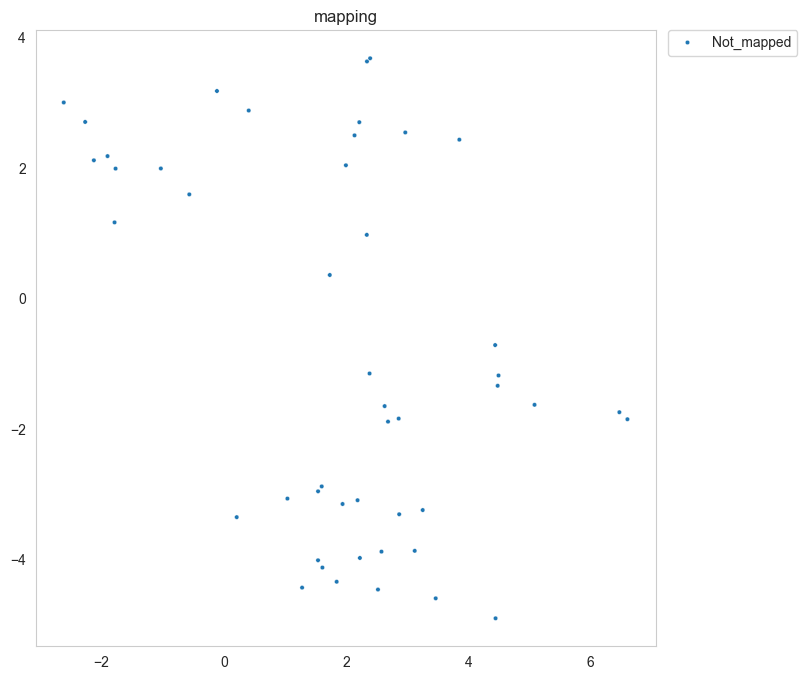

C98


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/3830868714.py:16: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcell_patient.obs['mapping'] ="Not_mapped"


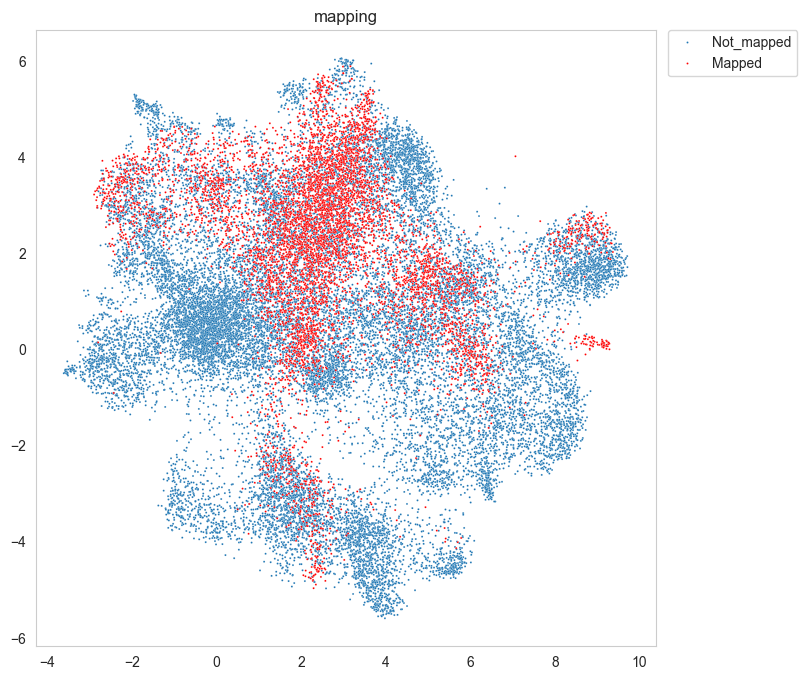

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/3830868714.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


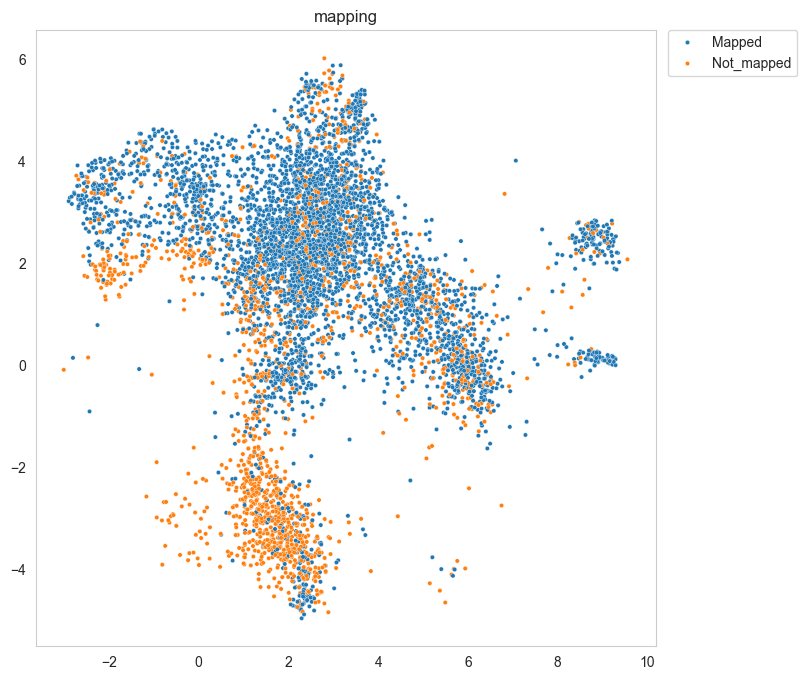

C66


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/3830868714.py:16: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcell_patient.obs['mapping'] ="Not_mapped"


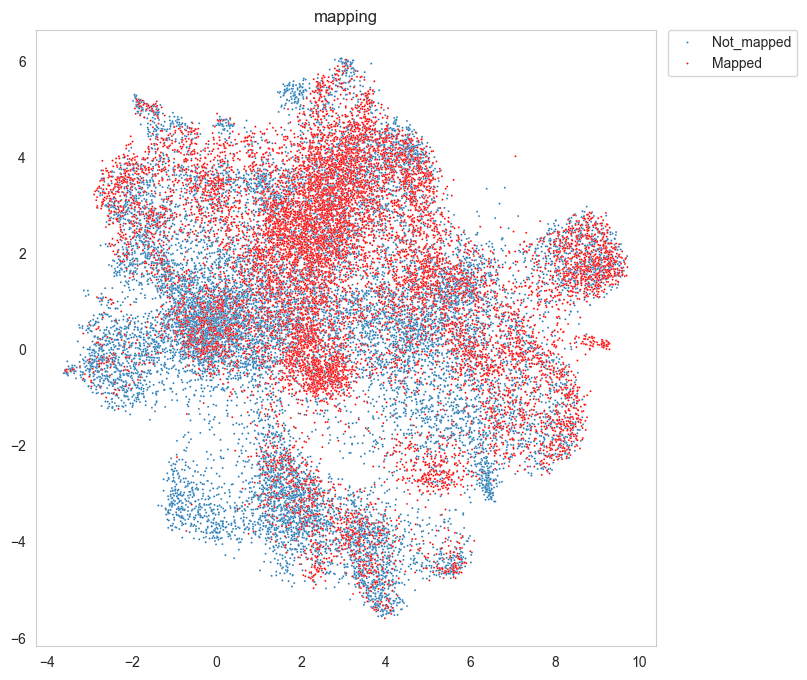

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/3830868714.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


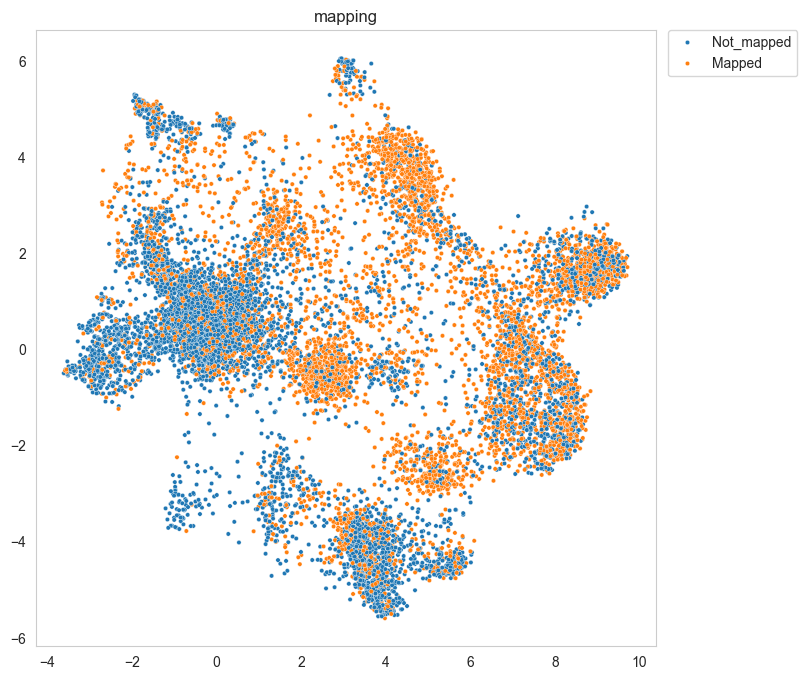

C86


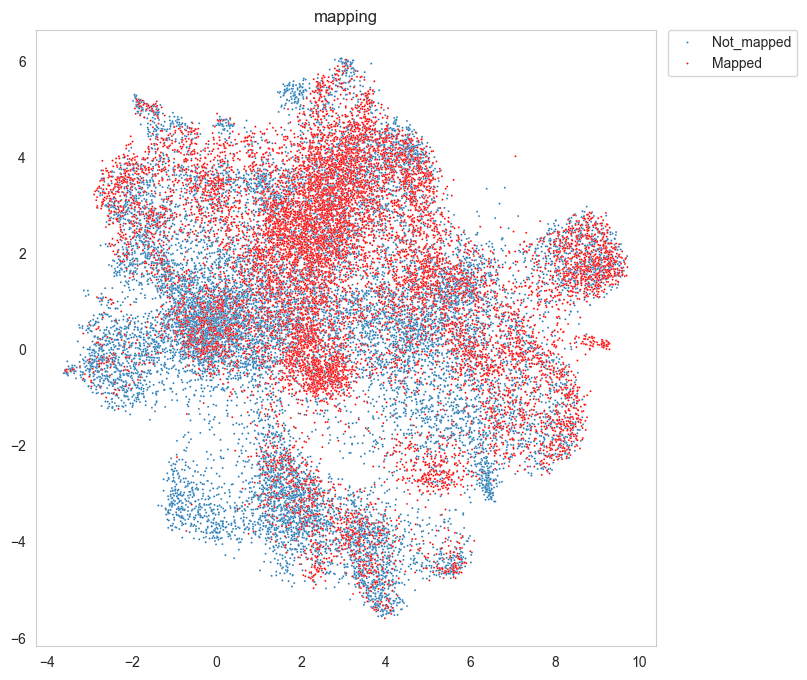

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/3830868714.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


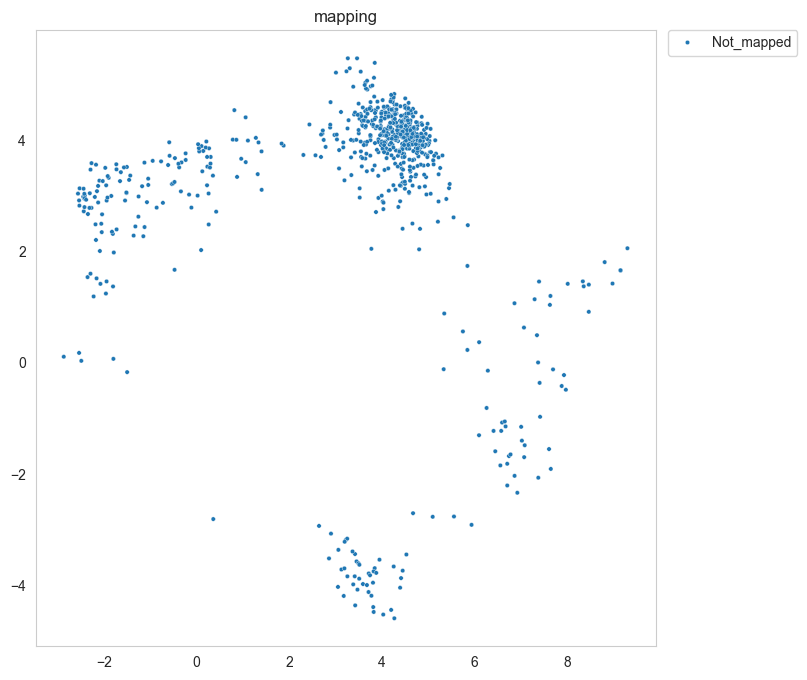

C160


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/3830868714.py:16: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcell_patient.obs['mapping'] ="Not_mapped"


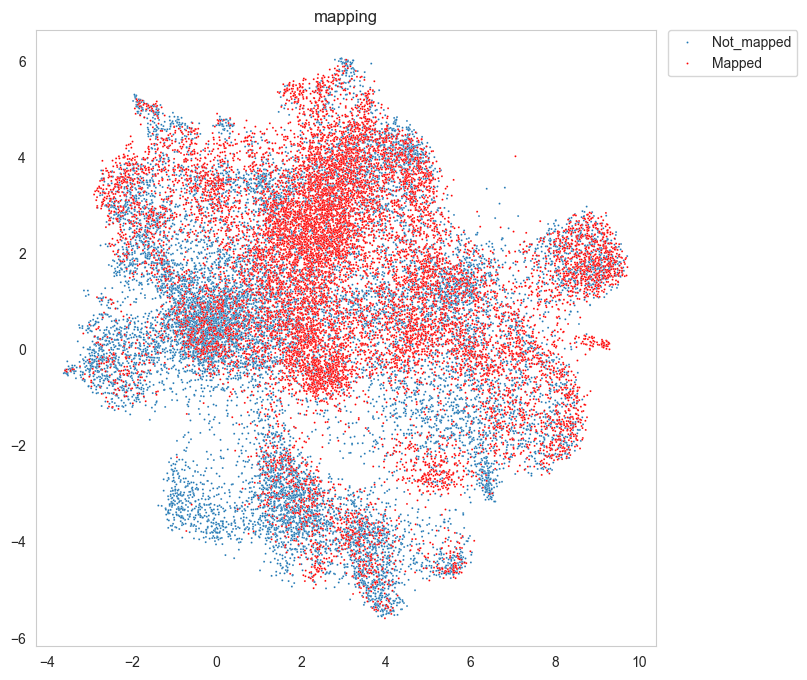

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/3830868714.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


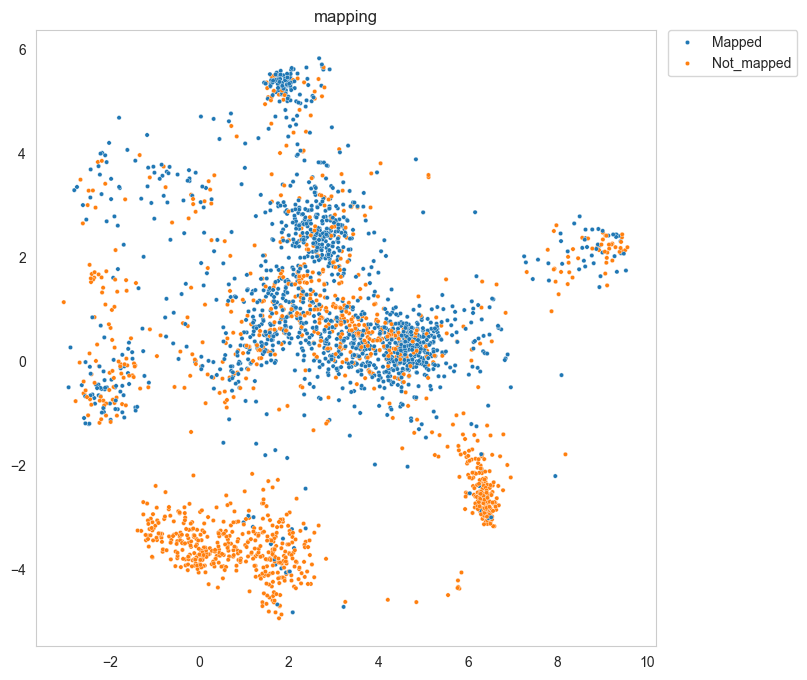

C179


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/3830868714.py:16: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcell_patient.obs['mapping'] ="Not_mapped"


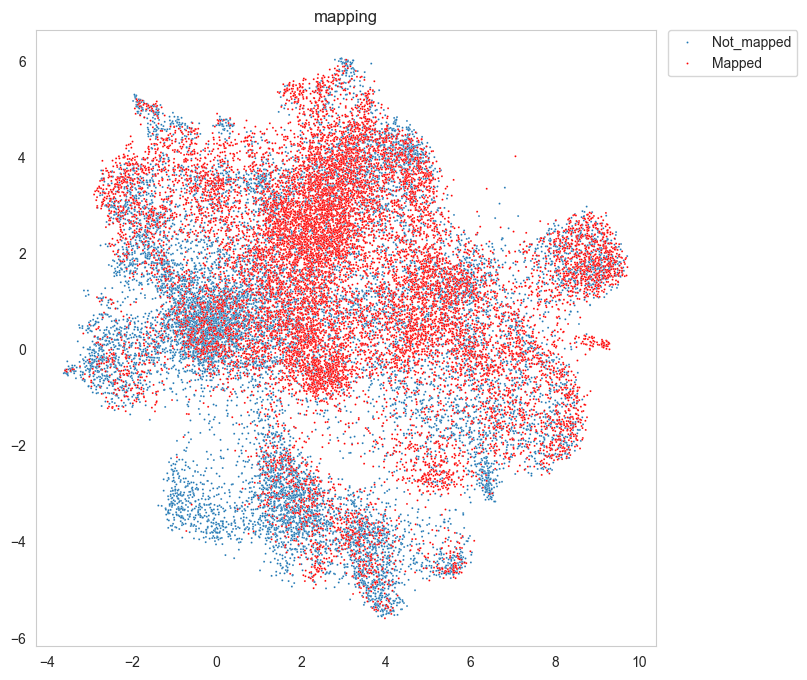

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/3830868714.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


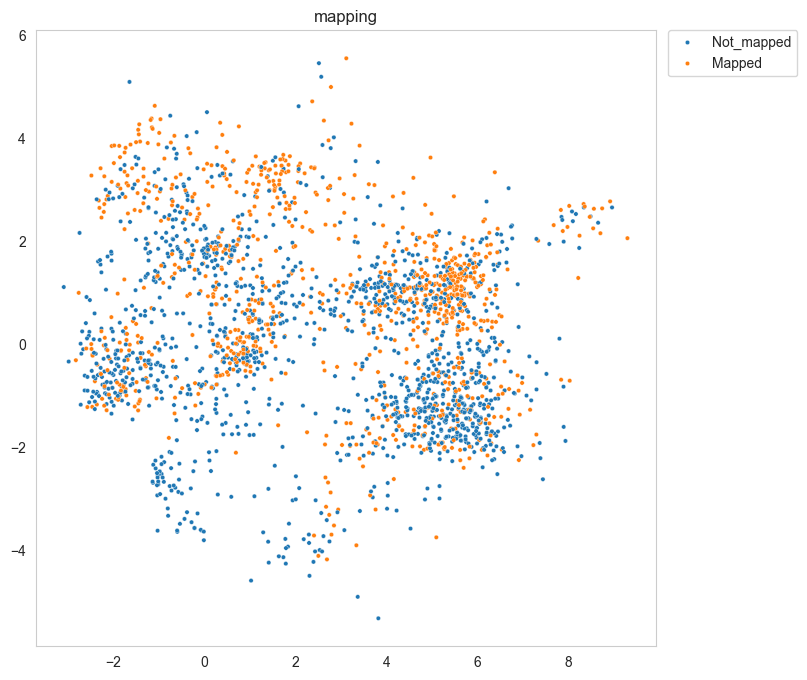

C155


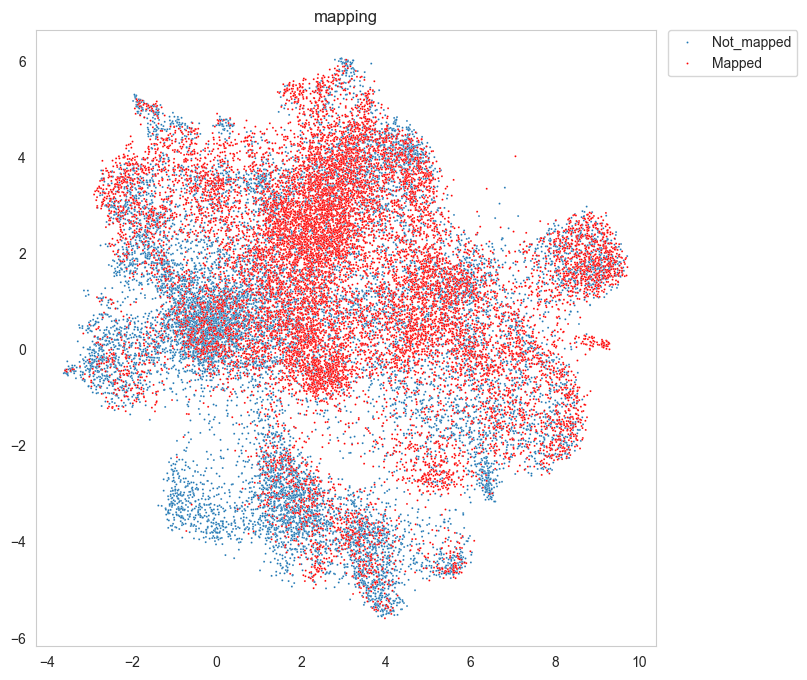

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/3830868714.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


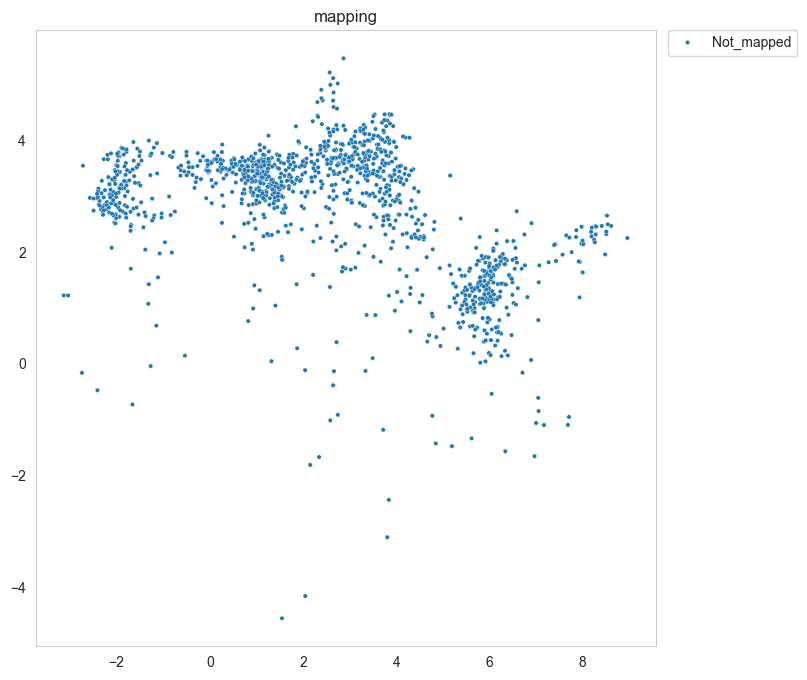

In [21]:
# How many cells are mapped

tcell_ann_shared.obs['mapping'] ="Not_mapped"
for patient in shared_patients:
    print(patient)
    tcr_sel = tcr_sel_all[tcr_sel_all['patient']==patient]
    tcell_patient= tcell_ann_shared[tcell_ann_shared.obs['PatientID']==patient]
    if len(tcr_sel) > 0:
        # Create a list of patterns from the 'barcode' column
        barcode_patterns = tcr_sel['barcode'].tolist()
        # Join patterns with "|" for regex OR operation
        combined_pattern = '|'.join(barcode_patterns)
        # Check if any pattern is present in the index of tcell_patient.obs
        matches = tcell_patient.obs.index.str.contains(combined_pattern)

        tcell_patient.obs['mapping'] ="Not_mapped"
        tcell_patient.obs.loc[matches,"mapping"]= 'Mapped'
        
        tcell_patient_mapped = tcell_patient[tcell_patient.obs['mapping']=='Mapped']
        tcell_ann_shared.obs.loc[tcell_ann_shared.obs.index.isin(tcell_patient_mapped.obs.index),"mapping"]= 'Mapped'
        
        
    meta = 'mapping'
    fig, ax = plt.subplots(figsize=(8,8))
    sns.set_style("whitegrid", {'axes.grid' : False})
    sns.scatterplot(x=tcell_ann_shared[tcell_ann_shared.obs['mapping'] =='Not_mapped'].obsm["X_umap"][:,0],y=tcell_ann_shared[tcell_ann_shared.obs['mapping'] =='Not_mapped'].obsm["X_umap"][:,1], hue=tcell_ann_shared[tcell_ann_shared.obs['mapping'] =='Not_mapped'].obs[meta],s=2)
    sns.scatterplot(x=tcell_ann_shared[tcell_ann_shared.obs['mapping'] =='Mapped'].obsm["X_umap"][:,0],y=tcell_ann_shared[tcell_ann_shared.obs['mapping'] =='Mapped'].obsm["X_umap"][:,1], hue=tcell_ann_shared[tcell_ann_shared.obs['mapping'] =='Mapped', ].obs[meta],s=2,palette=['red']).set(title=meta)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    plt.show()
    
    
    randomize=np.arange(len(tcell_patient.obs[meta]))
    np.random.shuffle(randomize)
    fig, ax = plt.subplots(figsize=(8,8))
    sns.set_style("whitegrid", {'axes.grid' : False})
    scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    plt.show()

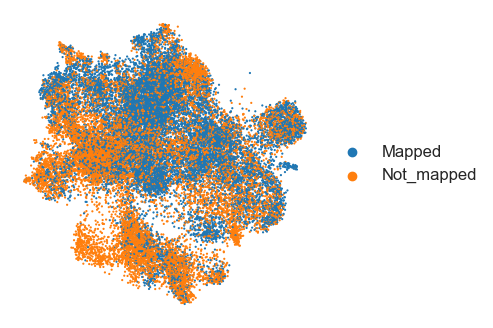

In [22]:
import matplotlib as mpl
# Update your existing rcParams
mpl.rcParams.update({
    'font.size': 12,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
    'figure.figsize': (4,4)  # Set default figure size to 6×4 inches
})
mpl.rcParams['axes.titlesize'] = 12
mpl.rcParams['xtick.labelsize'] = 12  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 12  # Colorbar tick label size

sc.pl.umap(tcell_ann_shared, color=['mapping'], frameon=False,
    size=10,  # Adjust this value to make the dots bigger (default is 120)
    show=False, title = '')  # We will save it manually)


# Save the plot manually with DPI 300
plt.savefig(FIGURES_DIR / 'umap_clusters_dpi300_mapped.pdf', dpi=300, bbox_inches='tight', transparent=True)
plt.savefig(FIGURES_DIR / 'umap_clusters_dpi300_mapped.png', dpi=300, bbox_inches='tight', transparent=True)
plt.savefig(FIGURES_DIR / 'umap_clusters_dpi300_mapped.svg', dpi=300, bbox_inches='tight', transparent=True)
# Show the plot (optional, if you want to see it before saving)
plt.show()

In [23]:
tcell_ann_shared

AnnData object with n_obs × n_vars = 28904 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet', 'mapping'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'B_doublet_colors', 'Epithelial_doublet_colors', 'Fibroblast_doublet_colors', 'Macrophage_doub

In [24]:
# How many cells are mapped
mapping_counts = tcell_ann_shared.obs['mapping'].value_counts()
print(mapping_counts)

mapping
Mapped        14479
Not_mapped    14425
Name: count, dtype: int64


In [25]:
#Load adaptive alloreactive clone info
adaptive_all = pd.read_csv(ALLCLONES_ALL_UNIQUE_PATH)

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/1459542179.py:2: DtypeWarning: Columns (9,11,14,15,16,17,18,19,21,22,23,24,25,26,27,28,29,33,34,42) have mixed types. Specify dtype option on import or set low_memory=False.
  adaptive_all = pd.read_csv(ALLCLONES_ALL_UNIQUE_PATH)


In [26]:
adaptive_all.columns

Index(['Unnamed: 0', 'rearrangement', 'cdr3_rearrangement', 'cdr3_amino_acid',
       'v_resolved', 'j_resolved', 'templates', 'frequency', 'PatientID',
       'timepoint', 'cell_type', 'tag', 'ifexpanded', 'type', 'DonorType',
       'Disease', 'PTCy', 'Conditioning', 'Sex', 'DoT', 'Onset',
       'GVHD_GRADE_1', 'GVHD_GRADE_2', 'GVHD_GRADE_3', 'GVHD_grade_14',
       'GVHD_grade_24', 'GVHD_grade_34', 'Steroid refractory GVHD',
       'Reshef reviewed', 'Comment', 'Age_R', 'HLA_mis', 'DLI_PTD', 'Relapse',
       'Off Immunosuppresion', 'GVHD_DX_Post_Transplant',
       'GVHD Max Grade Post Transplant', 'EBV +', 'HHV6 +',
       'Systemic_Steroids', 'CMV +', 'chronic GVHD', 'Chronic'],
      dtype='object')

In [27]:
adaptive_all.columns

Index(['Unnamed: 0', 'rearrangement', 'cdr3_rearrangement', 'cdr3_amino_acid',
       'v_resolved', 'j_resolved', 'templates', 'frequency', 'PatientID',
       'timepoint', 'cell_type', 'tag', 'ifexpanded', 'type', 'DonorType',
       'Disease', 'PTCy', 'Conditioning', 'Sex', 'DoT', 'Onset',
       'GVHD_GRADE_1', 'GVHD_GRADE_2', 'GVHD_GRADE_3', 'GVHD_grade_14',
       'GVHD_grade_24', 'GVHD_grade_34', 'Steroid refractory GVHD',
       'Reshef reviewed', 'Comment', 'Age_R', 'HLA_mis', 'DLI_PTD', 'Relapse',
       'Off Immunosuppresion', 'GVHD_DX_Post_Transplant',
       'GVHD Max Grade Post Transplant', 'EBV +', 'HHV6 +',
       'Systemic_Steroids', 'CMV +', 'chronic GVHD', 'Chronic'],
      dtype='object')

In [28]:
adaptive_all = adaptive_all.sort_values(by='templates', ascending=False)


In [29]:
adaptive_all['cdr3_rearrangement'][1]

'TGCAGCGTTCGGACAGGGGCGAACACTGAAGCTTTCTTT'

In [30]:
adaptive_all[adaptive_all['cdr3_rearrangement'] == adaptive_all['cdr3_rearrangement'][1]]

,Unnamed: 0,rearrangement,cdr3_rearrangement,cdr3_amino_acid,v_resolved,j_resolved,templates,frequency,PatientID,timepoint,...,Relapse,Off Immunosuppresion,GVHD_DX_Post_Transplant,GVHD Max Grade Post Transplant,EBV +,HHV6 +,Systemic_Steroids,CMV +,chronic GVHD,Chronic
88596,88597,ACTGTGAGCAACATGAGCCCTGAAGACAGCAGCATATATCTCTGCA...,TGCAGCGTTCGGACAGGGGCGAACACTGAAGCTTTCTTT,CSVRTGANTEAFF,TRBV29-1,TRBJ1-1,166,0.004480,R051,MLRCFSElo,...,NaN,YES; Day 185,81.0,NaN,NaN,NaN,81.0,NaN,43516.0,True
93259,93260,ACTGTGAGCTACATTAGCCCTGAAGACAGCAGCATATATCTCTGCA...,TGCAGCGTTCGGACAGGGGCGAACACTGAAGCTTTCTTT,CSVRTGANTEAFF,TRBV29-1,TRBJ1-1,1,0.000027,R051,MLRCFSElo,...,NaN,YES; Day 185,81.0,NaN,NaN,NaN,81.0,NaN,43516.0,True
100074,100075,ACTGTGAGCTACATTAGCCCTGAAGACAGCAGCATATATCTCTGCA...,TGCAGCGTTCGGACAGGGGCGAACACTGAAGCTTTCTTT,CSVRTGANTEAFF,TRBV29-1,TRBJ1-1,0,0.000000,R051,unstimulated,...,NaN,YES; Day 185,81.0,NaN,NaN,NaN,81.0,NaN,43516.0,True
86444,86445,ACTGTGAGCTACATTAGCCCTGAAGACAGCAGCATATATCTCTGCA...,TGCAGCGTTCGGACAGGGGCGAACACTGAAGCTTTCTTT,CSVRTGANTEAFF,TRBV29-1,TRBJ1-1,0,0.000000,R051,90,...,NaN,YES; Day 185,81.0,NaN,NaN,NaN,81.0,NaN,43516.0,True
95411,95412,ACTGTGAGCAACATGAGCCCTGAAGACAGCAGCATATATCTCTGCA...,TGCAGCGTTCGGACAGGGGCGAACACTGAAGCTTTCTTT,CSVRTGANTEAFF,TRBV29-1,TRBJ1-1,0,0.000000,R051,unstimulated,...,NaN,YES; Day 185,81.0,NaN,NaN,NaN,81.0,NaN,43516.0,True
27261,27262,ACTGTGAGCAACATGAGCCCTGAAGACAGCAGCATATATCTCTGCA...,TGCAGCGTTCGGACAGGGGCGAACACTGAAGCTTTCTTT,CSVRTGANTEAFF,TRBV29-1,TRBJ1-1,0,0.000000,R051,14,...,NaN,YES; Day 185,81.0,NaN,NaN,NaN,81.0,NaN,43516.0,True
20446,20447,ACTGTGAGCAACATGAGCCCTGAAGACAGCAGCATATATCTCTGCA...,TGCAGCGTTCGGACAGGGGCGAACACTGAAGCTTTCTTT,CSVRTGANTEAFF,TRBV29-1,TRBJ1-1,0,0.000000,R051,039UpperGI,...,NaN,YES; Day 185,81.0,NaN,NaN,NaN,81.0,NaN,43516.0,True
25109,25110,ACTGTGAGCTACATTAGCCCTGAAGACAGCAGCATATATCTCTGCA...,TGCAGCGTTCGGACAGGGGCGAACACTGAAGCTTTCTTT,CSVRTGANTEAFF,TRBV29-1,TRBJ1-1,0,0.000000,R051,039UpperGI,...,NaN,YES; Day 185,81.0,NaN,NaN,NaN,81.0,NaN,43516.0,True
38739,38740,ACTGTGAGCTACATTAGCCCTGAAGACAGCAGCATATATCTCTGCA...,TGCAGCGTTCGGACAGGGGCGAACACTGAAGCTTTCTTT,CSVRTGANTEAFF,TRBV29-1,TRBJ1-1,0,0.000000,R051,172,...,NaN,YES; Day 185,81.0,NaN,NaN,NaN,81.0,NaN,43516.0,True
31924,31925,ACTGTGAGCTACATTAGCCCTGAAGACAGCAGCATATATCTCTGCA...,TGCAGCGTTCGGACAGGGGCGAACACTGAAGCTTTCTTT,CSVRTGANTEAFF,TRBV29-1,TRBJ1-1,0,0.000000,R051,14,...,NaN,YES; Day 185,81.0,NaN,NaN,NaN,81.0,NaN,43516.0,True


In [31]:
import pandas as pd

# Sample structure of adap_data
# adap_data = pd.DataFrame({
#     'PatientID': [...],
#     'timepoint': [...]
# })

# Group by PatientID and get unique time points
grouped = adaptive_all.groupby('PatientID')['timepoint']

# Create a dictionary to store the number of unique time points for each patient
patient_time_points_count = {patient_id: len(set(timepoints)) for patient_id, timepoints in grouped}

# Print the number of unique time points for each patient
for patient_id, count in patient_time_points_count.items():
    print(f"Patient {patient_id} has {count} unique time points")

# Calculate mean, max, and min of the number of unique time points
counts = list(patient_time_points_count.values())
mean_count = sum(counts) / len(counts)
max_count = max(counts)
min_count = min(counts)

print("\nStatistics of the number of unique time points across all patients:")
print(f"Mean number of unique time points: {mean_count}")
print(f"Maximum number of unique time points: {max_count}")
print(f"Minimum number of unique time points: {min_count}")


Patient R051 has 18 unique time points
Patient R066 has 20 unique time points
Patient R067 has 15 unique time points
Patient R068 has 20 unique time points
Patient R069 has 20 unique time points
Patient R070 has 15 unique time points
Patient R076 has 12 unique time points
Patient R081 has 22 unique time points
Patient R086 has 19 unique time points
Patient R090 has 12 unique time points
Patient R091 has 16 unique time points
Patient R093 has 9 unique time points
Patient R098 has 20 unique time points
Patient R101 has 9 unique time points
Patient R137 has 16 unique time points
Patient R143 has 7 unique time points
Patient R150 has 14 unique time points
Patient R153 has 14 unique time points
Patient R154 has 6 unique time points
Patient R155 has 6 unique time points
Patient R160 has 12 unique time points
Patient R176 has 6 unique time points
Patient R179 has 14 unique time points
Patient R181 has 6 unique time points
Patient R183 has 6 unique time points

Statistics of the number of uniq

In [32]:
import pandas as pd

# Sample structure of adaptive_all
# adaptive_all = pd.DataFrame({
#     'PatientID': [...],
#     'timepoint': [...]
# })

# Group by PatientID and get unique time points
grouped = adaptive_all.groupby('PatientID')['timepoint']

# Create a dictionary to store the unique time points for each patient
# Convert all time points to strings for consistent sorting
patient_time_points = {patient_id: sorted(set(map(str, timepoints))) for patient_id, timepoints in grouped}

# Create a dictionary to store the number of unique time points for each patient
patient_time_points_count = {patient_id: len(timepoints) for patient_id, timepoints in patient_time_points.items()}

# Print the number of unique time points and the time point names for each patient
for patient_id, timepoints in patient_time_points.items():
    count = len(timepoints)
    print(f"Patient {patient_id} has {count} unique time points: {timepoints}")

# Calculate mean, max, and min of the number of unique time points
counts = list(patient_time_points_count.values())
mean_count = sum(counts) / len(counts)
max_count = max(counts)
min_count = min(counts)

print("\nStatistics of the number of unique time points across all patients:")
print(f"Mean number of unique time points: {mean_count}")
print(f"Maximum number of unique time points: {max_count}")
print(f"Minimum number of unique time points: {min_count}")



Patient R051 has 15 unique time points: ['039Colon', '039GVHD++', '039GVHD--', '039UpperGI', '14', '172', '28', '3', '365', '39', '56', '730', '90', 'MLRCFSElo', 'unstimulated']
Patient R066 has 11 unique time points: ['14', '180', '365', '375', '389', '398', '56', '663', '90', 'MLRCFSElo', 'unstimulated']
Patient R067 has 10 unique time points: ['22', '28', '3', '33', '55', 'Colon', 'Duodenum', 'GastricBody', 'MLRCFSElo', 'unstimulated']
Patient R068 has 11 unique time points: ['114', '129', '135', '14', '147', '164', '28', '56', '90', 'MLRCFSElo', 'unstimulated']
Patient R069 has 14 unique time points: ['100', '1095', '180', '2', '22', '28', '300', '365', '56', 'Duodenum', 'Esophogus', 'MLRCFSElo', 'Stomach', 'unstimulated']
Patient R070 has 9 unique time points: ['180', '21', '28', '365', '56', '90', 'Gut', 'MLRCFSElo', 'unstimulated']
Patient R076 has 7 unique time points: ['180', '30', '365', '56', '90', 'MLRCFSElo', 'unstimulated']
Patient R081 has 13 unique time points: ['148', 

In [33]:
#del adaptive_all

In [34]:
adaptive_all.head()

,Unnamed: 0,rearrangement,cdr3_rearrangement,cdr3_amino_acid,v_resolved,j_resolved,templates,frequency,PatientID,timepoint,...,Relapse,Off Immunosuppresion,GVHD_DX_Post_Transplant,GVHD Max Grade Post Transplant,EBV +,HHV6 +,Systemic_Steroids,CMV +,chronic GVHD,Chronic
3958878,3958879,CAGCGCACAGAGCAGCGGGACTCGGCCATGTATCGCTGTGCCAGCA...,TGTGCCAGCAGCTTGGGGACGGGTTACAATCAGCCCCAGCATTTT,CASSLGTGYNQPQHF,TRBV7-6,TRBJ1-5,121078,0.269939,R069,1095,...,NaN,YES; DAY 265,28.0,NaN,81.0,NaN,34.0,628.0,43237.0,True
12141118,12141119,CTGGAGCTGGGGGACTCAGCTTTGTATTTCTGTGCCAGCAGCGTTC...,TGTGCCAGCAGCGTTCGCCGGGACACCTCGAACACCGGGGAGCTGT...,CASSVRRDTSNTGELFF,TRBV9-1,TRBJ2-2,64927,0.081562,R143,365,...,NaN,Yes; Day 131,NaN,NaN,NaN,NaN,NaN,50.0,NaN,False
19415400,19415401,AAGATCCAGCCTGCAAAGCTTGAGGACTCGGCCGTGTATCTCTGTG...,TGTGCCTCTCTCTGGTATGGGGGGGATGAGCAGTTCTTC,CASLWYGGDEQFF,TRBV11-2,TRBJ2-1,58923,0.164500,R160,180,...,NaN,Yes; Day 97,28.0,NaN,NaN,242.0,NaN,96.0,NaN,False
19415401,19415402,GCTACCAGCTCCCAGACATCTGTGTACTTCTGTGCCATCAGTGAGC...,TGTGCCATCAGTGAGCTGTCTAGCGGTTTCCGGGGGGATGAGCAGT...,CAISELSSGFRGDEQFF,TRBV10-3,TRBJ2-1,40959,0.114348,R160,180,...,NaN,Yes; Day 97,28.0,NaN,NaN,242.0,NaN,96.0,NaN,False
15794007,15794008,GCTGCTCCCTCCCAGACATCTGTGTACTTCTGTGCCAGCAGTTACC...,TGTGCCAGCAGTTACCTCCTTGGGACGGGCTCTGGAAACACCATAT...,CASSYLLGTGSGNTIYF,TRBV6,TRBJ1-3,37719,0.045968,R150,unstimulated,...,NaN,Yes; Day 225,NaN,NaN,192.0,NaN,281.0,NaN,44559.0,True


In [35]:
adaptive_all.columns

Index(['Unnamed: 0', 'rearrangement', 'cdr3_rearrangement', 'cdr3_amino_acid',
       'v_resolved', 'j_resolved', 'templates', 'frequency', 'PatientID',
       'timepoint', 'cell_type', 'tag', 'ifexpanded', 'type', 'DonorType',
       'Disease', 'PTCy', 'Conditioning', 'Sex', 'DoT', 'Onset',
       'GVHD_GRADE_1', 'GVHD_GRADE_2', 'GVHD_GRADE_3', 'GVHD_grade_14',
       'GVHD_grade_24', 'GVHD_grade_34', 'Steroid refractory GVHD',
       'Reshef reviewed', 'Comment', 'Age_R', 'HLA_mis', 'DLI_PTD', 'Relapse',
       'Off Immunosuppresion', 'GVHD_DX_Post_Transplant',
       'GVHD Max Grade Post Transplant', 'EBV +', 'HHV6 +',
       'Systemic_Steroids', 'CMV +', 'chronic GVHD', 'Chronic'],
      dtype='object')

In [36]:
adaptive_all

,Unnamed: 0,rearrangement,cdr3_rearrangement,cdr3_amino_acid,v_resolved,j_resolved,templates,frequency,PatientID,timepoint,...,Relapse,Off Immunosuppresion,GVHD_DX_Post_Transplant,GVHD Max Grade Post Transplant,EBV +,HHV6 +,Systemic_Steroids,CMV +,chronic GVHD,Chronic
3958878,3958879,CAGCGCACAGAGCAGCGGGACTCGGCCATGTATCGCTGTGCCAGCA...,TGTGCCAGCAGCTTGGGGACGGGTTACAATCAGCCCCAGCATTTT,CASSLGTGYNQPQHF,TRBV7-6,TRBJ1-5,121078,0.269939,R069,1095,...,NaN,YES; DAY 265,28.0,NaN,81.0,NaN,34.0,628.0,43237.0,True
12141118,12141119,CTGGAGCTGGGGGACTCAGCTTTGTATTTCTGTGCCAGCAGCGTTC...,TGTGCCAGCAGCGTTCGCCGGGACACCTCGAACACCGGGGAGCTGT...,CASSVRRDTSNTGELFF,TRBV9-1,TRBJ2-2,64927,0.081562,R143,365,...,NaN,Yes; Day 131,NaN,NaN,NaN,NaN,NaN,50.0,NaN,False
19415400,19415401,AAGATCCAGCCTGCAAAGCTTGAGGACTCGGCCGTGTATCTCTGTG...,TGTGCCTCTCTCTGGTATGGGGGGGATGAGCAGTTCTTC,CASLWYGGDEQFF,TRBV11-2,TRBJ2-1,58923,0.164500,R160,180,...,NaN,Yes; Day 97,28.0,NaN,NaN,242.0,NaN,96.0,NaN,False
19415401,19415402,GCTACCAGCTCCCAGACATCTGTGTACTTCTGTGCCATCAGTGAGC...,TGTGCCATCAGTGAGCTGTCTAGCGGTTTCCGGGGGGATGAGCAGT...,CAISELSSGFRGDEQFF,TRBV10-3,TRBJ2-1,40959,0.114348,R160,180,...,NaN,Yes; Day 97,28.0,NaN,NaN,242.0,NaN,96.0,NaN,False
15794007,15794008,GCTGCTCCCTCCCAGACATCTGTGTACTTCTGTGCCAGCAGTTACC...,TGTGCCAGCAGTTACCTCCTTGGGACGGGCTCTGGAAACACCATAT...,CASSYLLGTGSGNTIYF,TRBV6,TRBJ1-3,37719,0.045968,R150,unstimulated,...,NaN,Yes; Day 225,NaN,NaN,192.0,NaN,281.0,NaN,44559.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10237943,10237944,ACGATTCAGCGCACAGAGCAGCGGGACTCGGCCATGTATCGCTGTG...,TGTGCCATACAGAGGGGAGGCACAGATACGCAGTATTTT,CAIQRGGTDTQYF,TRBV7,TRBJ2-3,0,0.000000,R137,21,...,NaN,Yes; Day 185,104.0,2.0,49.0,258.0,NaN,50.0,NaN,False
10237942,10237943,ACGATTCAGCGCACAGAGCAGCGGGACTCGGCCATGTATCGCTGTG...,TGTGCCAGTCGGGACAGCAATAATTCACCCCTCCACTTT,CASRDSNNSPLHF,TRBV7,TRBJ1-6,0,0.000000,R137,21,...,NaN,Yes; Day 185,104.0,2.0,49.0,258.0,NaN,50.0,NaN,False
10237941,10237942,ACGATTCAGCGCACAGAGCAGCGGGACTCGGCCATGTATCGCTGTG...,TGTGCCAGCTCCGACCATACAGATCAGCCCCAGCATTTT,CASSDHTDQPQHF,TRBV7,TRBJ1-5,0,0.000000,R137,21,...,NaN,Yes; Day 185,104.0,2.0,49.0,258.0,NaN,50.0,NaN,False
10237940,10237941,ACGATTCAGCGCACAGAGCAGCGGGACTCGGCCATGTATCGCTGTG...,TGTGCCAGCGGGCGAGGGGGCAGTGAGACCCAGTACTTC,CASGRGGSETQYF,TRBV7,TRBJ2-5,0,0.000000,R137,21,...,NaN,Yes; Day 185,104.0,2.0,49.0,258.0,NaN,50.0,NaN,False


In [37]:
adaptive_all.head(5)

,Unnamed: 0,rearrangement,cdr3_rearrangement,cdr3_amino_acid,v_resolved,j_resolved,templates,frequency,PatientID,timepoint,...,Relapse,Off Immunosuppresion,GVHD_DX_Post_Transplant,GVHD Max Grade Post Transplant,EBV +,HHV6 +,Systemic_Steroids,CMV +,chronic GVHD,Chronic
3958878,3958879,CAGCGCACAGAGCAGCGGGACTCGGCCATGTATCGCTGTGCCAGCA...,TGTGCCAGCAGCTTGGGGACGGGTTACAATCAGCCCCAGCATTTT,CASSLGTGYNQPQHF,TRBV7-6,TRBJ1-5,121078,0.269939,R069,1095,...,NaN,YES; DAY 265,28.0,NaN,81.0,NaN,34.0,628.0,43237.0,True
12141118,12141119,CTGGAGCTGGGGGACTCAGCTTTGTATTTCTGTGCCAGCAGCGTTC...,TGTGCCAGCAGCGTTCGCCGGGACACCTCGAACACCGGGGAGCTGT...,CASSVRRDTSNTGELFF,TRBV9-1,TRBJ2-2,64927,0.081562,R143,365,...,NaN,Yes; Day 131,NaN,NaN,NaN,NaN,NaN,50.0,NaN,False
19415400,19415401,AAGATCCAGCCTGCAAAGCTTGAGGACTCGGCCGTGTATCTCTGTG...,TGTGCCTCTCTCTGGTATGGGGGGGATGAGCAGTTCTTC,CASLWYGGDEQFF,TRBV11-2,TRBJ2-1,58923,0.164500,R160,180,...,NaN,Yes; Day 97,28.0,NaN,NaN,242.0,NaN,96.0,NaN,False
19415401,19415402,GCTACCAGCTCCCAGACATCTGTGTACTTCTGTGCCATCAGTGAGC...,TGTGCCATCAGTGAGCTGTCTAGCGGTTTCCGGGGGGATGAGCAGT...,CAISELSSGFRGDEQFF,TRBV10-3,TRBJ2-1,40959,0.114348,R160,180,...,NaN,Yes; Day 97,28.0,NaN,NaN,242.0,NaN,96.0,NaN,False
15794007,15794008,GCTGCTCCCTCCCAGACATCTGTGTACTTCTGTGCCAGCAGTTACC...,TGTGCCAGCAGTTACCTCCTTGGGACGGGCTCTGGAAACACCATAT...,CASSYLLGTGSGNTIYF,TRBV6,TRBJ1-3,37719,0.045968,R150,unstimulated,...,NaN,Yes; Day 225,NaN,NaN,192.0,NaN,281.0,NaN,44559.0,True


In [38]:
adaptive_all['singleton'] = "expanded"
adaptive_all.loc[adaptive_all['frequency']<=0.0001,'singleton']= 'singleton'
adaptive_all

,Unnamed: 0,rearrangement,cdr3_rearrangement,cdr3_amino_acid,v_resolved,j_resolved,templates,frequency,PatientID,timepoint,...,Off Immunosuppresion,GVHD_DX_Post_Transplant,GVHD Max Grade Post Transplant,EBV +,HHV6 +,Systemic_Steroids,CMV +,chronic GVHD,Chronic,singleton
3958878,3958879,CAGCGCACAGAGCAGCGGGACTCGGCCATGTATCGCTGTGCCAGCA...,TGTGCCAGCAGCTTGGGGACGGGTTACAATCAGCCCCAGCATTTT,CASSLGTGYNQPQHF,TRBV7-6,TRBJ1-5,121078,0.269939,R069,1095,...,YES; DAY 265,28.0,NaN,81.0,NaN,34.0,628.0,43237.0,True,expanded
12141118,12141119,CTGGAGCTGGGGGACTCAGCTTTGTATTTCTGTGCCAGCAGCGTTC...,TGTGCCAGCAGCGTTCGCCGGGACACCTCGAACACCGGGGAGCTGT...,CASSVRRDTSNTGELFF,TRBV9-1,TRBJ2-2,64927,0.081562,R143,365,...,Yes; Day 131,NaN,NaN,NaN,NaN,NaN,50.0,NaN,False,expanded
19415400,19415401,AAGATCCAGCCTGCAAAGCTTGAGGACTCGGCCGTGTATCTCTGTG...,TGTGCCTCTCTCTGGTATGGGGGGGATGAGCAGTTCTTC,CASLWYGGDEQFF,TRBV11-2,TRBJ2-1,58923,0.164500,R160,180,...,Yes; Day 97,28.0,NaN,NaN,242.0,NaN,96.0,NaN,False,expanded
19415401,19415402,GCTACCAGCTCCCAGACATCTGTGTACTTCTGTGCCATCAGTGAGC...,TGTGCCATCAGTGAGCTGTCTAGCGGTTTCCGGGGGGATGAGCAGT...,CAISELSSGFRGDEQFF,TRBV10-3,TRBJ2-1,40959,0.114348,R160,180,...,Yes; Day 97,28.0,NaN,NaN,242.0,NaN,96.0,NaN,False,expanded
15794007,15794008,GCTGCTCCCTCCCAGACATCTGTGTACTTCTGTGCCAGCAGTTACC...,TGTGCCAGCAGTTACCTCCTTGGGACGGGCTCTGGAAACACCATAT...,CASSYLLGTGSGNTIYF,TRBV6,TRBJ1-3,37719,0.045968,R150,unstimulated,...,Yes; Day 225,NaN,NaN,192.0,NaN,281.0,NaN,44559.0,True,expanded
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10237943,10237944,ACGATTCAGCGCACAGAGCAGCGGGACTCGGCCATGTATCGCTGTG...,TGTGCCATACAGAGGGGAGGCACAGATACGCAGTATTTT,CAIQRGGTDTQYF,TRBV7,TRBJ2-3,0,0.000000,R137,21,...,Yes; Day 185,104.0,2.0,49.0,258.0,NaN,50.0,NaN,False,singleton
10237942,10237943,ACGATTCAGCGCACAGAGCAGCGGGACTCGGCCATGTATCGCTGTG...,TGTGCCAGTCGGGACAGCAATAATTCACCCCTCCACTTT,CASRDSNNSPLHF,TRBV7,TRBJ1-6,0,0.000000,R137,21,...,Yes; Day 185,104.0,2.0,49.0,258.0,NaN,50.0,NaN,False,singleton
10237941,10237942,ACGATTCAGCGCACAGAGCAGCGGGACTCGGCCATGTATCGCTGTG...,TGTGCCAGCTCCGACCATACAGATCAGCCCCAGCATTTT,CASSDHTDQPQHF,TRBV7,TRBJ1-5,0,0.000000,R137,21,...,Yes; Day 185,104.0,2.0,49.0,258.0,NaN,50.0,NaN,False,singleton
10237940,10237941,ACGATTCAGCGCACAGAGCAGCGGGACTCGGCCATGTATCGCTGTG...,TGTGCCAGCGGGCGAGGGGGCAGTGAGACCCAGTACTTC,CASGRGGSETQYF,TRBV7,TRBJ2-5,0,0.000000,R137,21,...,Yes; Day 185,104.0,2.0,49.0,258.0,NaN,50.0,NaN,False,singleton


In [39]:
replacement_dict = {'R068': 'C068', 'R101': 'C101','R098': 'C98', 'R091': 'C91','R066': 'C66', 'R086': 'C86','R160': 'C160', 'R179': 'C179', 'R155': 'C155'}
adaptive_all['PatientID'] = adaptive_all['PatientID'].replace(replacement_dict)

In [40]:
shared_patients

['C068', 'C101', 'C98', 'C66', 'C86', 'C160', 'C179', 'C155']

In [41]:
adaptive_all= adaptive_all[adaptive_all['PatientID'].isin(shared_patients)]

In [42]:
adaptive_all.head(5)

,Unnamed: 0,rearrangement,cdr3_rearrangement,cdr3_amino_acid,v_resolved,j_resolved,templates,frequency,PatientID,timepoint,...,Off Immunosuppresion,GVHD_DX_Post_Transplant,GVHD Max Grade Post Transplant,EBV +,HHV6 +,Systemic_Steroids,CMV +,chronic GVHD,Chronic,singleton
19415400,19415401,AAGATCCAGCCTGCAAAGCTTGAGGACTCGGCCGTGTATCTCTGTG...,TGTGCCTCTCTCTGGTATGGGGGGGATGAGCAGTTCTTC,CASLWYGGDEQFF,TRBV11-2,TRBJ2-1,58923,0.164500,C160,180,...,Yes; Day 97,28.0,NaN,NaN,242.0,NaN,96.0,NaN,False,expanded
19415401,19415402,GCTACCAGCTCCCAGACATCTGTGTACTTCTGTGCCATCAGTGAGC...,TGTGCCATCAGTGAGCTGTCTAGCGGTTTCCGGGGGGATGAGCAGT...,CAISELSSGFRGDEQFF,TRBV10-3,TRBJ2-1,40959,0.114348,C160,180,...,Yes; Day 97,28.0,NaN,NaN,242.0,NaN,96.0,NaN,False,expanded
19415402,19415403,CTGGAGTCTGCTGCCTCCTCCCAGACATCTGTATATTTCTGCGCCA...,TGCGCCAGCAGTGAGGCGGGACAGGGTGGCGAGCAGTACTTC,CASSEAGQGGEQYF,TRBV10-1,TRBJ2-7,36656,0.102335,C160,180,...,Yes; Day 97,28.0,NaN,NaN,242.0,NaN,96.0,NaN,False,expanded
23139036,23139037,AATGTGAACGCCTTGGAGCTGGACGACTCGGCCCTGTATCTCTGTG...,TGTGCCAGCAGCTTTGGGGGCGGGGGAGAGCAGTACTTC,CASSFGGGGEQYF,TRBV5-4,TRBJ2-7,24917,0.034853,C179,unstimulated,...,No,43.0,44.0,66.0,NaN,44.0,NaN,NaN,False,expanded
4650934,4650935,CTGATCCTGGAGTCGCCCAGCCCCAACCAGACCTCTCTGTACTTCT...,TGTGCCAGCGGGAATAGCAATCAGCCCCAGCATTTT,CASGNSNQPQHF,TRBV27-1,TRBJ1-5,19746,0.336451,C86,202,...,Yes; DAY 238,30.0,35.0,NaN,NaN,31.0,224.0,NaN,False,expanded


In [43]:
adaptive_all['type'].unique()

array(['nonallo', 'allo'], dtype=object)

In [44]:
adaptive_all.shape

(12264191, 44)

In [45]:
# I need the other files too

In [46]:
tcr_sel_all

,barcode,SampleID_barcode,raw_clonotype_id,cdr3,cdr3_nt,#clones,V1,V2,J1,J2,Adaptive NT sequences,patient
0,AAACCTGTCAAGGTAA-1,UA01AAACCTGTCAAGGTAA-1,clonotype73,CSARDRGGQSYYEQYF,TGCAGTGCTAGAGATCGGGGGGGACAAAGCTACTACGAGCAGTACTTC,7,20,1,2,7,AGTGCCCATCCTGAAGACAGCAGCTTCTACATCTGCAGTGCTAGAG...,C068
1,AAACGGGAGCCAGAAC-1,UA01AAACGGGAGCCAGAAC-1,clonotype10,CSASLVGSLEGAFF,TGCAGTGCTAGTTTGGTGGGGTCCCTTGAGGGAGCTTTCTTT,42,20,1,1,1,GTGACCAGTGCCCATCCTGAAGACAGCAGCTTCTACATCTGCAGTG...,C068
2,AAACGGGTCGTCGTTC-1,UA01AAACGGGTCGTCGTTC-1,clonotype4,CSARVLAGVSYNEQFF,TGCAGTGCTAGAGTGCTAGCGGGAGTTTCCTACAATGAGCAGTTCTTC,88,20,1,2,1,AGTGCCCATCCTGAAGACAGCAGCTTCTACATCTGCAGTGCTAGAG...,C068
3,AAACGGGTCGTCGTTC-1,UA01AAACGGGTCGTCGTTC-1,clonotype4,CSARRLAGISYNEQFF,TGCAGTGCTAGGCGACTAGCGGGGATCTCCTACAATGAGCAGTTCTTC,88,20,1,2,1,AGTGCCCATCCTGAAGACAGCAGCTTCTACATCTGCAGTGCTAGGC...,C068
4,AAAGATGAGCGTAGTG-1,UA01AAAGATGAGCGTAGTG-1,clonotype327,CASSLSAGGFGGYTF,TGTGCCAGCAGCTTGTCGGCAGGGGGCTTTGGTGGCTACACCTTC,3,5,6,1,2,AACGCCTTGTTGCTGGGGGACTCGGCCCTCTATCTCTGTGCCAGCA...,C068
...,...,...,...,...,...,...,...,...,...,...,...,...
22215,TTGTAGGTCAGGATCT-1,UA37TTGTAGGTCAGGATCT-1,clonotype611,CASSRGGSSYNEQFF,TGTGCCAGCAGCCGCGGGGGGAGCTCCTACAATGAGCAGTTCTTC,1,11,2,2,1,CAGCCTGCAAAGCTTGAGGACTCGGCCGTGTATCTCTGTGCCAGCA...,C179
22216,TTTACTGCAGAGCCAA-1,UA37TTTACTGCAGAGCCAA-1,clonotype17,CASCPDSYGYTF,TGTGCCAGCTGCCCCGATTCCTATGGCTACACCTTC,9,6,2,1,2,NNNNNNNNNNTGTCGGCTGCTCCCTCCCAAACATCTGTGTACTTCT...,C179
22217,TTTACTGTCCCAAGAT-1,UA37TTTACTGTCCCAAGAT-1,clonotype72,CASSRQPAGTDFYEQYF,TGCGCCAGCAGCCGCCAACCTGCCGGGACAGACTTTTACGAGCAGT...,5,4,1,2,7,CTGCAGCCAGAAGACTCAGCCCTGTATCTCTGCGCCAGCAGCCGCC...,C179
22218,TTTCCTCAGACACGAC-1,UA37TTTCCTCAGACACGAC-1,clonotype585,CASSLTSGVYNEQFF,TGTGCCAGCAGCCTTACTAGCGGGGTTTACAATGAGCAGTTCTTC,1,11,1,2,1,CAGCCTGCAGAGCTTGGGGACTCGGCCATGTATCTCTGTGCCAGCA...,C179


In [47]:
tcell_patient= tcell_ann[tcell_ann.obs['PatientID']==patient]
tcell_patient

View of AnnData object with n_obs × n_vars = 1190 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet', 'SampleID_barcode', 'mapping'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'B_doublet_colors', 'Epithelial_doublet_colors', 'Fibroblast_double

C068


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/2415320879.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adaptive_patient['timepoint'] = adaptive_patient['timepoint'].astype(str)
/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


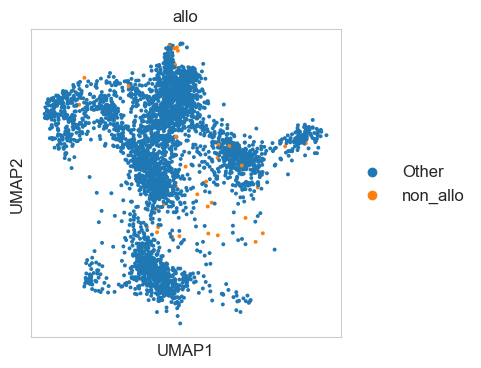

3754
C101


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/2415320879.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adaptive_patient['timepoint'] = adaptive_patient['timepoint'].astype(str)
/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


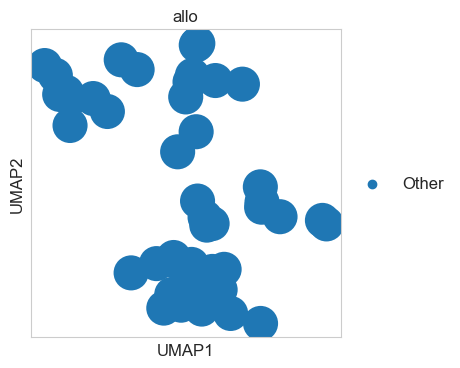

47
C98


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/2415320879.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adaptive_patient['timepoint'] = adaptive_patient['timepoint'].astype(str)
/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


['ACACCCTTCTCACATT-1', 'AACACGTAGACAATAC-1', 'ATTGGACAGTTTGCGT-1', 'CAGCTGGCATCGTCGG-1', 'CGGAGCTCATGCCCGA-1']


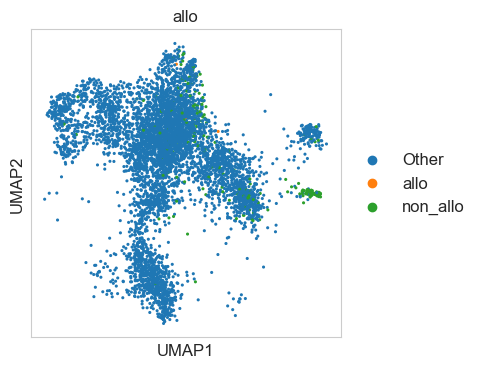

6018
C66


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/2415320879.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adaptive_patient['timepoint'] = adaptive_patient['timepoint'].astype(str)


['ACCCACTTCGCCAAAT-1', 'CACAGGCTCTCATTCA-1', 'CACTCCAGTTTGGCGC-1', 'CGGAGCTAGTACTTGC-1', 'CTCGAGGGTTTGTGTG-1', 'GACCTGGGTTTGACTG-1', 'GTCAAGTTCTGTCAAG-1', 'TACTTGTTCTGATTCT-1', 'TGCACCTAGTGCGTGA-1', 'TCGAGGCAGAAGGTGA-1', 'TGACTTTGTCCGTCAG-1']


/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


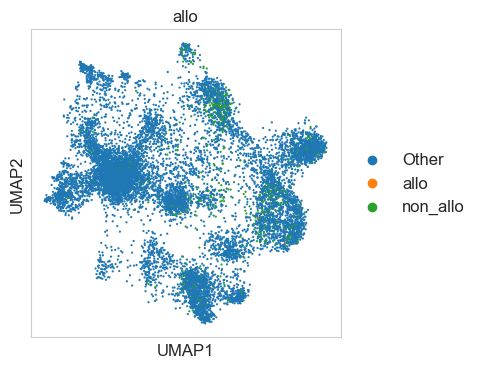

12069
C86


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/2415320879.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adaptive_patient['timepoint'] = adaptive_patient['timepoint'].astype(str)
/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


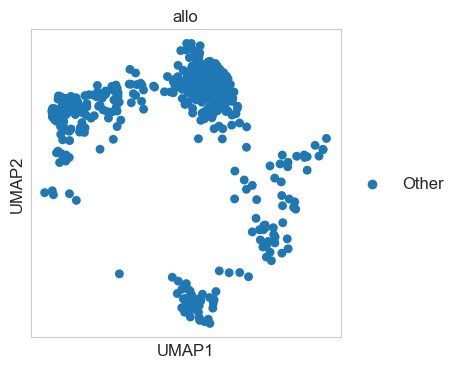

734
C160


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/2415320879.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adaptive_patient['timepoint'] = adaptive_patient['timepoint'].astype(str)
/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


['CCTACCACACCAGGTC-1', 'CTCACACGTCAGCTAT-1']


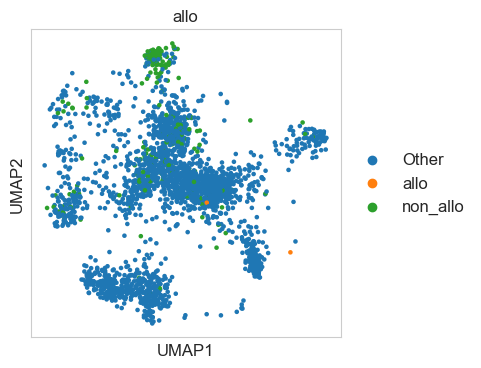

2768
C179
['ACACCGGAGTTGTCGT-1', 'TGATTTCAGACTAGGC-1', 'AACCATGTCAAACAAG-1', 'ACACCAACAACGATCT-1', 'ACCCACTAGCCAGTAG-1', 'CCATTCGGTAATCGTC-1', 'GTTCTCGTCTGCCAGG-1', 'TGCCCATGTTTAGGAA-1', 'TTTACTGCAAAGGTGC-1', 'ACTGTCCTCAGAGCTT-1', 'ACTTACTAGCATGGCA-1', 'CCTTTCTAGAATTCCC-1', 'TGCCAAATCCGCGCAA-1']


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/2415320879.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adaptive_patient['timepoint'] = adaptive_patient['timepoint'].astype(str)
/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


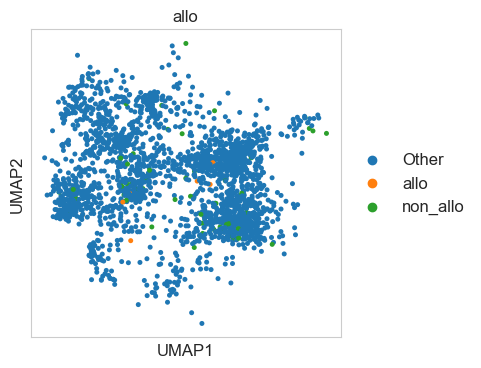

2324
C155


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/2415320879.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adaptive_patient['timepoint'] = adaptive_patient['timepoint'].astype(str)
/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


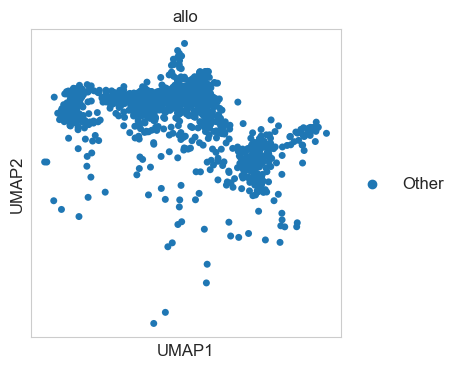

1190


In [48]:
# How many alloreactive clones are mapped
tcell_ann.obs['allo'] ="Other"
for patient in shared_patients:
    print(patient)
    tcr_sel = tcr_sel_all[tcr_sel_all['patient']==patient]
    tcell_patient= tcell_ann[tcell_ann.obs['PatientID']==patient]
    adaptive_patient= adaptive_all[adaptive_all['PatientID'] == patient]
    adaptive_patient['timepoint'] = adaptive_patient['timepoint'].astype(str)
    adaptive_patient_mapped = adaptive_patient[adaptive_patient['cdr3_rearrangement'].isin(tcr_sel['cdr3_nt'])]
    #print(adaptive_patient_mapped)
    #category_counts = adaptive_patient_mapped['timepoint'].value_counts()
    #print(category_counts)
    adaptive_patient_mapped_allo =adaptive_patient_mapped[adaptive_patient_mapped['type']== 'allo']
    adaptive_patient_mapped_non_allo =adaptive_patient_mapped[adaptive_patient_mapped['type']== 'nonallo']
    tcr_sel_allo=tcr_sel[tcr_sel['cdr3_nt'].isin(adaptive_patient_mapped_allo['cdr3_rearrangement'])]
    tcr_sel_non_allo=tcr_sel[tcr_sel['cdr3_nt'].isin(adaptive_patient_mapped_non_allo['cdr3_rearrangement'])]
    if len(tcr_sel_allo)> 0:
        # Create a list of patterns from the 'barcode' column
        barcode_patterns = tcr_sel_allo['barcode'].tolist()
        # Join patterns with "|" for regex OR operation
        combined_pattern = '|'.join(barcode_patterns)
        print(barcode_patterns)
        # Check if any pattern is present in the index of tcell_c179.obs
        matches = tcell_patient.obs.index.str.contains(combined_pattern)
        tcell_patient.obs.loc[matches,"allo"]= 'allo'
        tcell_patient_allo = tcell_patient[tcell_patient.obs['allo']=='allo']
        tcell_ann.obs.loc[tcell_ann.obs.index.isin(tcell_patient_allo.obs.index),"allo"]= 'allo'


    if len(tcr_sel_non_allo)> 0:
        # Create a list of patterns from the 'barcode' column
        barcode_patterns = tcr_sel_non_allo['barcode'].tolist()
        # Join patterns with "|" for regex OR operation
        combined_pattern = '|'.join(barcode_patterns)
        # Check if any pattern is present in the index of tcell_c179.obs
        matches = tcell_patient.obs.index.str.contains(combined_pattern)
        tcell_patient.obs.loc[matches,"allo"]= 'non_allo'
        tcell_patient_non_allo = tcell_patient[tcell_patient.obs['allo']=='non_allo']
        tcell_ann.obs.loc[tcell_ann.obs.index.isin(tcell_patient_non_allo.obs.index),"allo"]= 'non_allo'

    sc.pl.umap(tcell_patient, color=['allo'])
    print(len(tcell_patient))

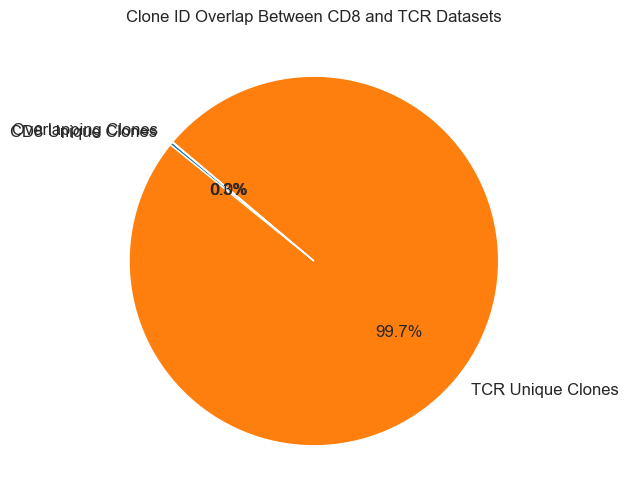

In [49]:
cd8_clone_ids = set(tcr_sel_all_mapped['cdr3_nt'].unique())
tcr_clone_ids = set(adaptive_all['cdr3_rearrangement'].unique())

# Find overlaps (intersection)
overlapping_clone_ids = cd8_clone_ids.intersection(tcr_clone_ids)
# Data for the pie chart
total_cd8_clones = len(cd8_clone_ids)
total_tcr_clones = len(tcr_clone_ids)
overlapping_clones = len(overlapping_clone_ids)

# Non-overlapping counts
cd8_unique_clones = total_cd8_clones - overlapping_clones
tcr_unique_clones = total_tcr_clones - overlapping_clones

# Pie chart values and labels
values = [cd8_unique_clones, tcr_unique_clones, overlapping_clones]
labels = ['CD8 Unique Clones', 'TCR Unique Clones', 'Overlapping Clones']

# Create the pie chart
plt.figure(figsize=(8, 6))
plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=140)
plt.title("Clone ID Overlap Between CD8 and TCR Datasets")
plt.show()

In [50]:
values

[4385, 1558061, 533]

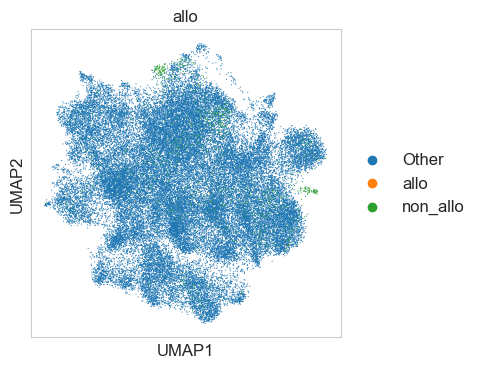

In [51]:
sc.pl.umap(tcell_ann, color=['allo'])

In [52]:
table = pd.pivot_table(tcell_ann.obs,index = 'PatientID',columns = 'mapping',aggfunc='count') 

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7346/1844175778.py:1: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  table = pd.pivot_table(tcell_ann.obs,index = 'PatientID',columns = 'mapping',aggfunc='count')


In [53]:
table

B_doublet            Dates_from_Transplantation             \
mapping      Mapped Not_mapped                     Mapped Not_mapped   
PatientID                                                              
C66            5420       6649                       5420       6649   
C068           2345       1409                       2345       1409   
C86               0        734                          0        734   
C98            4254       1764                       4254       1764   
C101              0         47                          0         47   
C152              0       1347                          0       1347   
C155              0       1190                          0       1190   
C157              0       1683                          0       1683   
C159              0       2558                          0       2558   
C160           1467       1301                       1467       1301   
C162              0        491                          0        491   
C179            942       1382                        942       1382   
ND001             0       4886                          0          0   
ND003             0        698                          0          0   
R085              0       6586                          0       6586   
R096              0       3263                          0       3263   

          Days_post-Transplant            Disease               DoT  \
mapping                 Mapped Not_mapped  Mapped Not_mapped Mapped   
PatientID                                                             
C66                       5420       6649    5420       6649   5420   
C068                      2345       1409    2345       1409   2345   
C86                          0        734       0        734      0   
C98                       4254       1764    4254       1764   4254   
C101                         0         47       0         47      0   
C152                         0       1347       0       1347      0   
C155                         0       1190       0       1190      0   
C157                         0       1683       0       1683      0   
C159                         0       2558       0       2558      0   
C160                      1467       1301    1467       1301   1467   
C162                         0        491       0        491      0   
C179                       942       1382     942       1382    942   
ND001                        0          0       0          0      0   
ND003                        0          0       0          0      0   
R085                         0       6586       0       6586      0   
R096                         0       3263       0       3263      0   

                      ... n_genes_by_counts            pct_counts_mt  \
mapping   Not_mapped  ...            Mapped Not_mapped        Mapped   
PatientID             ...                                              
C66             6649  ...              5420       6649          5420   
C068            1409  ...              2345       1409          2345   
C86              734  ...                 0        734             0   
C98             1764  ...              4254       1764          4254   
C101              47  ...                 0         47             0   
C152            1347  ...                 0       1347             0   
C155            1190  ...                 0       1190             0   
C157            1683  ...                 0       1683             0   
C159            2558  ...                 0       2558             0   
C160            1301  ...              1467       1301          1467   
C162             491  ...                 0        491             0   
C179            1382  ...               942       1382           942   
ND001           4886  ...                 0       4886             0   
ND003            698  ...                 0        698             0   
R085            6586  ...                 0       6586             

In [54]:
tcell_ann.write(TCELL_ANN_MAPPED_PATH)

In [55]:
tcell_ann = anndata.read_h5ad(TCELL_ANN_MAPPED_PATH)

In [56]:
tcell_ann

AnnData object with n_obs × n_vars = 50416 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet', 'SampleID_barcode', 'mapping', 'allo'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'B_doublet_colors', 'Epithelial_doublet_colors', 'Fibroblast_doubl

In [57]:
tcell_ann.obs['allo']

R096_Tc17_up_AAACCTGCATCCCACT-1    Other
R096_Tc17_up_AAACCTGGTTGGAGGT-1    Other
R096_Tc17_up_AAACCTGTCTATCCTA-1    Other
R096_Tc17_up_AAACGGGAGGATGCGT-1    Other
R096_Tc17_up_AAACGGGGTAAATGAC-1    Other
                                   ...  
UA41_TGTTCCGAGGACAGCT-1            Other
UA41_TTAGGACGTTGTTTGG-1            Other
UA41_TTAGGACTCCCAAGAT-1            Other
UA41_TTCGAAGTCCGCATCT-1            Other
UA41_TTGCGTCCAAGAAAGG-1            Other
Name: allo, Length: 50416, dtype: category
Categories (3, object): ['Other', 'allo', 'non_allo']

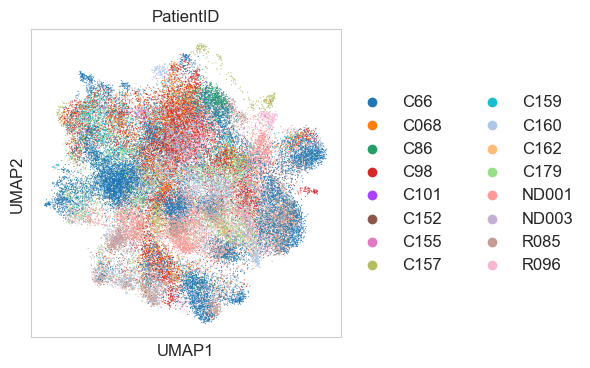

In [58]:
sc.pl.umap(tcell_ann, color=['PatientID'])

In [59]:
tcell_ann.obs['patient&allo'] = tcell_ann.obs['PatientID'].astype(str)+tcell_ann.obs['allo'].astype(str)

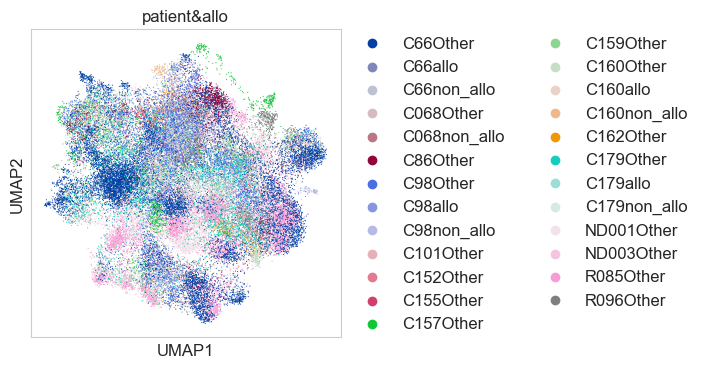

In [60]:
sc.pl.umap(tcell_ann, color=['patient&allo'])

In [61]:
tcell_ann.obs['mapping']

R096_Tc17_up_AAACCTGCATCCCACT-1    Not_mapped
R096_Tc17_up_AAACCTGGTTGGAGGT-1    Not_mapped
R096_Tc17_up_AAACCTGTCTATCCTA-1    Not_mapped
R096_Tc17_up_AAACGGGAGGATGCGT-1    Not_mapped
R096_Tc17_up_AAACGGGGTAAATGAC-1    Not_mapped
                                      ...    
UA41_TGTTCCGAGGACAGCT-1            Not_mapped
UA41_TTAGGACGTTGTTTGG-1            Not_mapped
UA41_TTAGGACTCCCAAGAT-1            Not_mapped
UA41_TTCGAAGTCCGCATCT-1            Not_mapped
UA41_TTGCGTCCAAGAAAGG-1            Not_mapped
Name: mapping, Length: 50416, dtype: category
Categories (2, object): ['Mapped', 'Not_mapped']

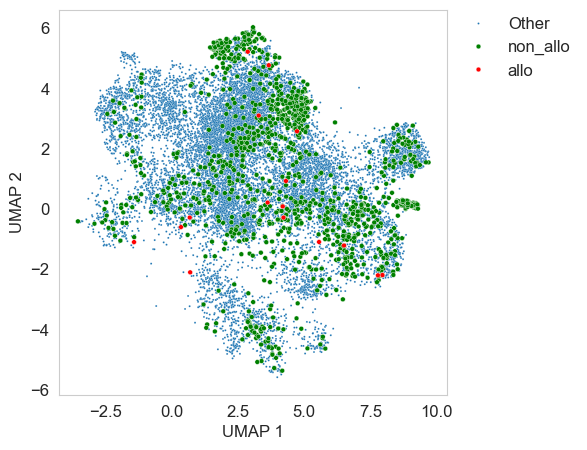

In [62]:
import matplotlib as mpl
# Update your existing rcParams
mpl.rcParams.update({
    'font.size': 12,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
    'figure.figsize': (4,4)  # Set default figure size to 6×4 inches
})
#mpl.rcParams['axes.titlesize'] = 8
#mpl.rcParams['xtick.labelsize'] = 8  # Colorbar tick label size 
#mpl.rcParams['ytick.labelsize'] = 8  # Colorbar tick label size

tcell_ann_mapped = tcell_ann[tcell_ann.obs['mapping']=='Mapped']
meta = 'allo'
fig, ax = plt.subplots(figsize=(5,5))
sns.set_style("whitegrid", {'axes.grid' : False})
sns.scatterplot(x=tcell_ann_mapped[tcell_ann_mapped.obs['allo'] =='Other'].obsm["X_umap"][:,0],y=tcell_ann_mapped[tcell_ann_mapped.obs['allo'] =='Other'].obsm["X_umap"][:,1], hue=tcell_ann_mapped[tcell_ann_mapped.obs['allo'] =='Other'].obs[meta],s=2)
sns.scatterplot(x=tcell_ann_mapped[tcell_ann_mapped.obs['allo'] =='non_allo'].obsm["X_umap"][:,0],y=tcell_ann_mapped[tcell_ann_mapped.obs['allo'] =='non_allo'].obsm["X_umap"][:,1], hue=tcell_ann_mapped[tcell_ann_mapped.obs['allo'] =='non_allo'].obs[meta],palette=['green'],s=12)
sns.scatterplot(x=tcell_ann_mapped[tcell_ann_mapped.obs['allo'] =='allo'].obsm["X_umap"][:,0],y=tcell_ann_mapped[tcell_ann_mapped.obs['allo'] =='allo'].obsm["X_umap"][:,1], hue=tcell_ann_mapped[tcell_ann_mapped.obs['allo'] =='allo'].obs[meta],s=12,palette=['red']).set(title=meta)
ax.set_title('')
ax.set_xlabel('UMAP 1')
ax.set_ylabel('UMAP 2')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, frameon=False)
plt.savefig(FIGURES_DIR / 'umap_clusters_dpi300_allo.pdf', dpi=300, bbox_inches='tight', transparent=True)
plt.savefig(FIGURES_DIR / 'umap_clusters_dpi300_allo.png', dpi=300, bbox_inches='tight', transparent=True)
plt.savefig(FIGURES_DIR / 'umap_clusters_dpi300_allo.svg', dpi=300, bbox_inches='tight', transparent=True)
plt.show()